In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="iF5JrjL70cHU0tochWb2")
project = rf.workspace("projectcollege-msi80").project("yolo-fabric-defect-detector")
version = project.version(2)
dataset = version.download("coco")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.7/88.7 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 77.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 14.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to yolo-fabric-defect-detector-2 in coco:: 100%|██████████| 2119/2119 [00:00<00:00, 7896.82it/s]


In [7]:
import os

print(os.listdir("yolo-fabric-defect-detector-2"))


['README.roboflow.txt', 'README.dataset.txt', 'valid', 'train', 'test']


Number of images in train: 1842
Categories: ['defect', 'hole', 'objects', 'oil_spot', 'thread_error']


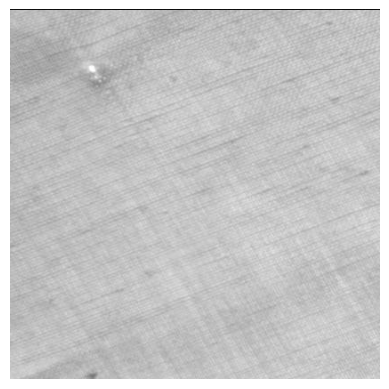

In [8]:
from PIL import Image
import json
import matplotlib.pyplot as plt

# Load annotation file
ann_path = "yolo-fabric-defect-detector-2/train/_annotations.coco.json"
with open(ann_path, "r") as f:
    data = json.load(f)

print("Number of images in train:", len(data["images"]))
print("Categories:", [c["name"] for c in data["categories"]])

# Show first image
img_name = data["images"][0]["file_name"]
img_path = os.path.join("yolo-fabric-defect-detector-2/train", img_name)

img = Image.open(img_path)
plt.imshow(img)
plt.axis("off")
plt.show()

In [11]:
import json
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def show_image_with_boxes(img_dir, ann_file, index=0):
    # Load annotations
    with open(ann_file, "r") as f:
        coco_data = json.load(f)

    # Get image info
    img_info = coco_data["images"][index]
    img_path = os.path.join(img_dir, img_info["file_name"])
    img = Image.open(img_path)

    # Create plot
    fig, ax = plt.subplots(1, figsize=(8,8))
    ax.imshow(img)

    # Find all annotations for this image
    anns = [a for a in coco_data["annotations"] if a["image_id"] == img_info["id"]]

    # Draw each bounding box
    for ann in anns:
        x, y, w, h = ann["bbox"]  # COCO format
        rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor="red", facecolor="none")
        ax.add_patch(rect)

        # Add label text
        cat_id = ann["category_id"]
        cat_name = [c["name"] for c in coco_data["categories"] if c["id"] == cat_id][0]
        ax.text(x, y-5, cat_name, color="red", fontsize=10, backgroundcolor="white")

    plt.axis("off")
    plt.show()


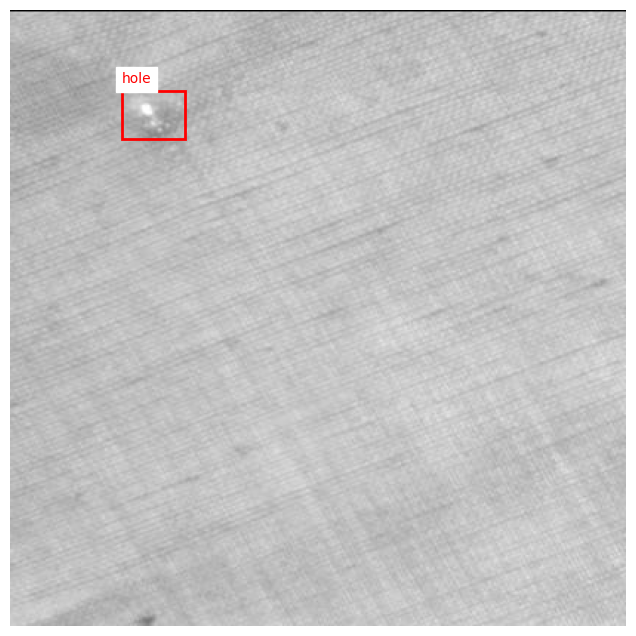

In [12]:
img_dir = "yolo-fabric-defect-detector-2/train"
ann_file = "yolo-fabric-defect-detector-2/train/_annotations.coco.json"

# Show the first image with boxes
show_image_with_boxes(img_dir, ann_file, index=0)

In [13]:
import torch
import torch.nn as nn
import torchvision.models as models

class Backbone(nn.Module):
    def __init__(self, arch="resnet50", pretrained=True, trainable_layers=3):
        super(Backbone, self).__init__()

        # Load ResNet model
        if arch == "resnet18":
            resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1 if pretrained else None)
        elif arch == "resnet50":
            resnet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1 if pretrained else None)
        else:
            raise ValueError("Only resnet18 or resnet50 supported for now")

        # Remove the FC + avgpool
        self.body = nn.Sequential(*list(resnet.children())[:-2])
        # This keeps conv1 → conv2_x → conv3_x → conv4_x → conv5_x

        # Optionally freeze some early layers
        for name, param in self.body.named_parameters():
            param.requires_grad = False  # freeze all
        # Unfreeze last N layers
        for name, param in list(self.body.named_parameters())[-trainable_layers:]:
            param.requires_grad = True

        # Number of output channels depends on the ResNet depth
        self.out_channels = 512 if arch == "resnet18" else 2048

    def forward(self, x):
        """
        Input: x [B, 3, H, W]
        Output: feature maps [B, C, H', W']
        """
        return self.body(x)

# Example usage
if __name__ == "__main__":
    backbone = Backbone("resnet50", pretrained=True)
    dummy_input = torch.randn(2, 3, 224, 224)  # batch of 2 images
    features = backbone(dummy_input)
    print(features.shape)  # e.g. [2, 2048, 7, 7] for ResNet50 + 224x224 input


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 207MB/s]


torch.Size([2, 2048, 7, 7])


In [14]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.ops import nms

# ---------------------------
# Helpers
# ---------------------------

@torch.no_grad()
def clip_boxes_to_image(boxes, size):
    H, W = size
    boxes[:, 0::4] = boxes[:, 0::4].clamp(min=0, max=W - 1)
    boxes[:, 1::4] = boxes[:, 1::4].clamp(min=0, max=H - 1)
    boxes[:, 2::4] = boxes[:, 2::4].clamp(min=0, max=W - 1)
    boxes[:, 3::4] = boxes[:, 3::4].clamp(min=0, max=H - 1)
    return boxes

@torch.no_grad()
def remove_small_boxes(boxes, min_size):
    ws = boxes[:, 2] - boxes[:, 0]
    hs = boxes[:, 3] - boxes[:, 1]
    keep = (ws >= min_size) & (hs >= min_size)
    return keep.nonzero(as_tuple=False).squeeze(1)

# ---------------------------
# Anchor Generator (small + elongated)
# ---------------------------

def generate_base_anchors(base_size, ratios, scales):
    base = torch.tensor([0, 0, base_size - 1, base_size - 1], dtype=torch.float32)
    x_ctr = (base[0] + base[2]) * 0.5
    y_ctr = (base[1] + base[3]) * 0.5
    size = base_size * base_size

    anchors = []
    for r in ratios:
        w = math.sqrt(size / r)
        h = w * r
        for s in scales:
            ws = w * s
            hs = h * s
            anchors.append([
                x_ctr - 0.5 * (ws - 1),
                y_ctr - 0.5 * (hs - 1),
                x_ctr + 0.5 * (ws - 1),
                y_ctr + 0.5 * (hs - 1),
            ])
    return torch.tensor(anchors, dtype=torch.float32)

def shift_anchors(base_anchors, feat_h, feat_w, stride, device):
    xs = torch.arange(0, feat_w * stride, step=stride, device=device, dtype=torch.float32)
    ys = torch.arange(0, feat_h * stride, step=stride, device=device, dtype=torch.float32)
    gy, gx = torch.meshgrid(ys, xs, indexing="ij")
    shifts = torch.stack([gx.reshape(-1), gy.reshape(-1), gx.reshape(-1), gy.reshape(-1)], dim=1)

    A = base_anchors.size(0)
    K = shifts.size(0)
    anchors = base_anchors.to(device).view(1, A, 4) + shifts.view(K, 1, 4)
    return anchors.view(K * A, 4)

class AnchorGenerator(nn.Module):
    """
    Tuned for small/elongated defects:
      - stride=16 (use C4 features)
      - base_size=16
      - ratios include thin shapes (1/3, 1/2, 1, 2, 3)
      - small scales (2, 3, 4, 6, 8)
    """
    def __init__(self,
                 stride=16,
                 base_size=16,
                 ratios=(1/3, 0.5, 1.0, 2.0, 3.0),
                 scales=(2, 3, 4, 6, 8)):
        super().__init__()
        self.stride = stride
        self.register_buffer(
            "base_anchors",
            generate_base_anchors(base_size, ratios, scales)
        )

    def forward(self, feat_h, feat_w, device):
        return shift_anchors(self.base_anchors, feat_h, feat_w, self.stride, device)

# ---------------------------
# Deltas → Boxes
# ---------------------------

def apply_deltas_to_anchors(deltas, anchors):
    ax = (anchors[:, 0] + anchors[:, 2]) * 0.5
    ay = (anchors[:, 1] + anchors[:, 3]) * 0.5
    aw = anchors[:, 2] - anchors[:, 0] + 1.0
    ah = anchors[:, 3] - anchors[:, 1] + 1.0

    dx, dy, dw, dh = deltas.unbind(1)
    px = dx * aw + ax
    py = dy * ah + ay
    pw = aw * torch.exp(dw).clamp(max=1e4)
    ph = ah * torch.exp(dh).clamp(max=1e4)

    x1 = px - 0.5 * (pw - 1.0)
    y1 = py - 0.5 * (ph - 1.0)
    x2 = px + 0.5 * (pw - 1.0)
    y2 = py + 0.5 * (ph - 1.0)
    return torch.stack([x1, y1, x2, y2], dim=1)

# ---------------------------
# RPN Head
# ---------------------------

class RPNHead(nn.Module):
    def __init__(self, in_channels, num_anchors):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, in_channels, 3, 1, 1)
        self.cls_logits = nn.Conv2d(in_channels, num_anchors, 1, 1, 0)
        self.bbox_deltas = nn.Conv2d(in_channels, num_anchors * 4, 1, 1, 0)

        for m in [self.conv, self.cls_logits, self.bbox_deltas]:
            nn.init.normal_(m.weight, std=0.01)
            nn.init.constant_(m.bias, 0)

    def forward(self, x):
        t = F.relu(self.conv(x))
        logits = self.cls_logits(t)      # [B, A, H, W]
        deltas = self.bbox_deltas(t)     # [B, 4A, H, W]
        return logits, deltas

# ---------------------------
# Region Proposal Network
# ---------------------------

class RegionProposalNetwork(nn.Module):
    def __init__(self,
                 in_channels,
                 anchor_stride=16,
                 anchor_base_size=16,
                 anchor_ratios=(1/3, 0.5, 1.0, 2.0, 3.0),
                 anchor_scales=(2, 3, 4, 6, 8),
                 pre_nms_topk=4000,
                 post_nms_topk=1000,
                 nms_thresh=0.7,
                 min_box_size=4.0):
        super().__init__()
        self.anchor_gen = AnchorGenerator(
            stride=anchor_stride,
            base_size=anchor_base_size,
            ratios=anchor_ratios,
            scales=anchor_scales
        )
        num_anchors = self.anchor_gen.base_anchors.size(0)
        self.head = RPNHead(in_channels, num_anchors)

        self.pre_nms_topk = pre_nms_topk
        self.post_nms_topk = post_nms_topk
        self.nms_thresh = nms_thresh
        self.min_box_size = min_box_size

    def forward(self, features, image_sizes):
        """
        features:    [B, C, H, W]  (e.g., C4 with stride=16)
        image_sizes: list of (H_img, W_img) per image
        returns:
          proposals: list[Tensor], each [N,4] in (x1,y1,x2,y2)
        """
        B, _, H, W = features.shape
        device = features.device

        logits, deltas = self.head(features)
        # reshape to [B, H*W*A] and [B, H*W*A, 4]
        A = logits.shape[1]
        logits = logits.permute(0, 2, 3, 1).reshape(B, -1)
        deltas = deltas.permute(0, 2, 3, 1).reshape(B, -1, 4)

        anchors = self.anchor_gen(H, W, device)  # [H*W*A, 4]

        proposals = []
        for b in range(B):
            scores = logits[b].sigmoid()
            boxes = apply_deltas_to_anchors(deltas[b], anchors)
            boxes = clip_boxes_to_image(boxes, image_sizes[b])

            # filter tiny boxes (useful for noisy small deltas)
            keep_sz = remove_small_boxes(boxes, self.min_box_size)
            boxes = boxes[keep_sz]
            scores = scores[keep_sz]

            # pre-nms top-k
            topk = min(self.pre_nms_topk, scores.numel())
            svals, sidx = scores.topk(topk)
            boxes = boxes[sidx]

            # NMS + post limit
            keep = nms(boxes, svals, self.nms_thresh)[: self.post_nms_topk]
            proposals.append(boxes[keep])

        return proposals



In [15]:
# features should be from a higher-res stage (e.g., ResNet C4, stride=16)
features = torch.randn(2, 1024, 14, 14)   # example C4 map for ~224–256 px images
image_sizes = [(256, 256), (256, 256)]

rpn = RegionProposalNetwork(in_channels=1024)  # 1024 for ResNet50 C4
props = rpn(features, image_sizes)
print(props[0].shape)  



torch.Size([1000, 4])


In [16]:
# ---------------------------
# Box utilities
# ---------------------------

@torch.no_grad()
def clip_boxes_to_image(boxes, size):
    H, W = size
    boxes[:, 0::4] = boxes[:, 0::4].clamp(min=0, max=W - 1)
    boxes[:, 1::4] = boxes[:, 1::4].clamp(min=0, max=H - 1)
    boxes[:, 2::4] = boxes[:, 2::4].clamp(min=0, max=W - 1)
    boxes[:, 3::4] = boxes[:, 3::4].clamp(min=0, max=H - 1)
    return boxes

def apply_box_deltas(boxes, deltas):
    """
    boxes:  [N,4]  (x1,y1,x2,y2)
    deltas: [N,4]  (tx,ty,tw,th)
    """
    ax = (boxes[:, 0] + boxes[:, 2]) * 0.5
    ay = (boxes[:, 1] + boxes[:, 3]) * 0.5
    aw = boxes[:, 2] - boxes[:, 0] + 1.0
    ah = boxes[:, 3] - boxes[:, 1] + 1.0

    tx, ty, tw, th = deltas.unbind(1)
    px = tx * aw + ax
    py = ty * ah + ay
    pw = aw * torch.exp(tw).clamp(max=1e4)
    ph = ah * torch.exp(th).clamp(max=1e4)

    x1 = px - 0.5 * (pw - 1.0)
    y1 = py - 0.5 * (ph - 1.0)
    x2 = px + 0.5 * (pw - 1.0)
    y2 = py + 0.5 * (ph - 1.0)
    return torch.stack([x1, y1, x2, y2], dim=1)

# ---------------------------
# RoI Align wrapper
# ---------------------------

class SingleScaleRoIAlign(nn.Module):
    """
    Wrap torchvision.ops.roi_align for a single feature map level.
    spatial_scale = 1 / stride  (e.g., stride=16 -> 1/16)
    """
    def __init__(self, output_size=(7, 7), sampling_ratio=2, stride=16):
        super().__init__()
        self.output_size = output_size
        self.sampling_ratio = sampling_ratio
        self.spatial_scale = 1.0 / float(stride)

    def forward(self, features, proposals):
        """
        features:  [B, C, H, W]
        proposals: list[Tensor] length B, each [Ni,4] in image coords
        returns:   [sum(Ni), C, 7, 7]
        """
        B = features.shape[0]
        # concatenate with batch indices
        rois = []
        for b, boxes in enumerate(proposals):
            if boxes.numel() == 0:
                continue
            idx = torch.full((boxes.shape[0], 1), b, dtype=boxes.dtype, device=boxes.device)
            rois.append(torch.cat([idx, boxes], dim=1))  # [idx, x1,y1,x2,y2]
        if len(rois) == 0:
            return torch.zeros(0, features.size(1), *self.output_size, device=features.device)
        rois = torch.cat(rois, dim=0)  # [M, 5]
        return roi_align(
            features, rois,
            output_size=self.output_size,
            spatial_scale=self.spatial_scale,
            sampling_ratio=self.sampling_ratio,
            aligned=True
        )

# ---------------------------
# ROI Head (2-FC head)
# ---------------------------

class TwoFCHead(nn.Module):
    """
    Standard Faster R-CNN box head:
      RoI pooled feature -> flatten -> FC -> ReLU -> FC -> ReLU
    """
    def __init__(self, in_channels, pool_size=7, fc_dim=1024):
        super().__init__()
        self.pool_size = pool_size
        self.fc1 = nn.Linear(in_channels * pool_size * pool_size, fc_dim)
        self.fc2 = nn.Linear(fc_dim, fc_dim)
        for m in [self.fc1, self.fc2]:
            nn.init.normal_(m.weight, std=0.01)
            nn.init.constant_(m.bias, 0)

    def forward(self, x):
        x = torch.flatten(x, start_dim=1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        return x  # [M, fc_dim]

# ---------------------------
# ROI Heads (classifier + bbox reg + postprocess)
# ---------------------------

class ROIHeads(nn.Module):
    """
    Inference-only heads for simplicity.
    num_classes includes background (e.g., 2 = {bg, defect})
    """
    def __init__(self,
                 in_channels,              # C from backbone feature map
                 num_classes=2,            # bg + 1 defect class by default
                 pool_size=7,
                 fc_dim=1024,
                 score_thresh=0.05,
                 nms_thresh=0.5,
                 detections_per_img=300,
                 stride=16):
        super().__init__()
        self.pooler = SingleScaleRoIAlign((pool_size, pool_size), sampling_ratio=2, stride=stride)
        self.box_head = TwoFCHead(in_channels, pool_size, fc_dim)
        self.cls_score = nn.Linear(fc_dim, num_classes)
        self.bbox_pred = nn.Linear(fc_dim, num_classes * 4)  # class-specific box deltas

        nn.init.normal_(self.cls_score.weight, std=0.01)
        nn.init.constant_(self.cls_score.bias, 0)
        nn.init.normal_(self.bbox_pred.weight, std=0.001)
        nn.init.constant_(self.bbox_pred.bias, 0)

        self.score_thresh = score_thresh
        self.nms_thresh = nms_thresh
        self.detections_per_img = detections_per_img
        self.num_classes = num_classes

    def forward(self, features, proposals, image_sizes):
        """
        features:    [B, C, H, W] (e.g., C4 features, stride=16)
        proposals:   list[Tensor] length B, each [Ni,4] from RPN (image coords)
        image_sizes: list[(H_img, W_img)]
        returns: detections: list[Tensor] length B, each [K,6] = (x1,y1,x2,y2,score,label)
        """
        # 1) RoI Align
        pooled = self.pooler(features, proposals)  # [M, C, 7, 7]
        if pooled.numel() == 0:
            return [torch.zeros(0, 6, device=features.device) for _ in proposals]

        # 2) Box head
        feats = self.box_head(pooled)              # [M, fc_dim]

        # 3) Classifier + bbox reg
        logits = self.cls_score(feats)             # [M, num_classes]
        bbox_deltas = self.bbox_pred(feats)        # [M, num_classes*4]

        # 4) Split back per image
        num_per_image = [p.shape[0] for p in proposals]
        logits_list = logits.split(num_per_image, dim=0)
        deltas_list = bbox_deltas.split(num_per_image, dim=0)

        detections = []
        for boxes, cls_logits, deltas, img_size in zip(proposals, logits_list, deltas_list, image_sizes):
            probs = F.softmax(cls_logits, dim=1)   # [N, K]
            scores, labels = probs[:, 1:].max(dim=1)  # best foreground class among 1..K-1
            labels = labels + 1  # shift back to true class ids

            # gather class-specific deltas
            N = boxes.size(0)
            deltas = deltas.view(N, self.num_classes, 4)
            # pick deltas for chosen classes
            idx = labels.view(-1, 1, 1).expand(-1, 1, 4)
            deltas_chosen = deltas.gather(1, idx).squeeze(1)  # [N,4]

            # refine & clip
            refined = apply_box_deltas(boxes, deltas_chosen)
            refined = clip_boxes_to_image(refined, img_size)

            # threshold
            keep = scores >= self.score_thresh
            refined, scores_k, labels_k = refined[keep], scores[keep], labels[keep]

            # NMS per class (simple single-class NMS here; for multi-class loop per class)
            # For fabric defects (1 class), this is enough:
            keep_idx = nms(refined, scores_k, self.nms_thresh)[: self.detections_per_img]
            det = torch.cat([refined[keep_idx], scores_k[keep_idx].unsqueeze(1), labels_k[keep_idx].unsqueeze(1).float()], dim=1)
            detections.append(det)  # [K,6]
        return detections

In [17]:
# features from backbone (prefer C4, stride=16 for small defects)
# Example sizes:
from torchvision.ops import roi_align

B = 2
features = torch.randn(B, 1024, 14, 14)       # ResNet50 C4-like
image_sizes = [(256, 256), (256, 256)]

# proposals from your tuned RPN step (list of length B, each [N,4])
# e.g., dummy:
proposals = [torch.rand(300,4)*256 for _ in range(B)]
for i in range(B):
    # ensure x1<=x2, y1<=y2
    p = proposals[i]
    x1 = torch.min(p[:,0], p[:,2]); y1 = torch.min(p[:,1], p[:,3])
    x2 = torch.max(p[:,0], p[:,2]); y2 = torch.max(p[:,1], p[:,3])
    proposals[i] = torch.stack([x1,y1,x2,y2], dim=1)

# Build ROI heads (num_classes=2 → background + 1 defect)
roi_heads = ROIHeads(in_channels=1024, num_classes=2, stride=16)

detections = roi_heads(features, proposals, image_sizes)



In [18]:
print(detections[0][:5])

tensor([[131.6808, 198.3591, 137.0067, 223.1975,   0.5534,   1.0000],
        [ 71.9828,  63.3913, 149.7048, 197.1282,   0.5532,   1.0000],
        [ 77.6522, 184.4401, 195.3469, 224.6095,   0.5439,   1.0000],
        [ 21.3588,  47.7930,  54.1740, 206.3046,   0.5429,   1.0000],
        [161.4068,  73.4912, 172.6592, 222.5318,   0.5373,   1.0000]],
       grad_fn=<SliceBackward0>)


In [19]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# =========================================
# Utils: IoU, encode deltas, SmoothL1
# =========================================

def box_iou(boxes1, boxes2):
    """
    boxes: [N,4], [M,4] in (x1,y1,x2,y2)
    return: [N,M] IoU
    """
    if boxes1.numel() == 0 or boxes2.numel() == 0:
        return boxes1.new_zeros((boxes1.size(0), boxes2.size(0)))
    x11, y11, x12, y12 = boxes1[:,0], boxes1[:,1], boxes1[:,2], boxes1[:,3]
    x21, y21, x22, y22 = boxes2[:,0], boxes2[:,1], boxes2[:,2], boxes2[:,3]

    xa = torch.max(x11[:,None], x21[None,:])
    ya = torch.max(y11[:,None], y21[None,:])
    xb = torch.min(x12[:,None], x22[None,:])
    yb = torch.min(y12[:,None], y22[None,:])

    inter_w = (xb - xa + 1).clamp(min=0)
    inter_h = (yb - ya + 1).clamp(min=0)
    inter = inter_w * inter_h

    area1 = (x12 - x11 + 1) * (y12 - y11 + 1)
    area2 = (x22 - x21 + 1) * (y22 - y21 + 1)

    union = area1[:,None] + area2[None,:] - inter
    iou = inter / union.clamp(min=1e-6)
    return iou


def encode_deltas(src_boxes, tgt_boxes):
    """
    Parametrization used in Faster R-CNN:
      t_x = (x_gt - x_a) / w_a
      t_y = (y_gt - y_a) / h_a
      t_w = log(w_gt / w_a)
      t_h = log(h_gt / h_a)
    """
    ax = (src_boxes[:,0] + src_boxes[:,2]) * 0.5
    ay = (src_boxes[:,1] + src_boxes[:,3]) * 0.5
    aw = (src_boxes[:,2] - src_boxes[:,0] + 1.0)
    ah = (src_boxes[:,3] - src_boxes[:,1] + 1.0)

    gx = (tgt_boxes[:,0] + tgt_boxes[:,2]) * 0.5
    gy = (tgt_boxes[:,1] + tgt_boxes[:,3]) * 0.5
    gw = (tgt_boxes[:,2] - tgt_boxes[:,0] + 1.0)
    gh = (tgt_boxes[:,3] - tgt_boxes[:,1] + 1.0)

    tx = (gx - ax) / aw
    ty = (gy - ay) / ah
    tw = torch.log(gw / aw)
    th = torch.log(gh / ah)
    return torch.stack([tx, ty, tw, th], dim=1)


class SmoothL1LossBeta(nn.Module):
    """
    Smooth L1 with beta (Huber). beta=1/9 is common in Detectron-style configs.
    """
    def __init__(self, beta=1.0/9.0, reduction='sum'):
        super().__init__()
        self.beta = beta
        self.reduction = reduction

    def forward(self, pred, target, weight=None):
        diff = torch.abs(pred - target)
        loss = torch.where(diff < self.beta, 0.5 * diff * diff / self.beta, diff - 0.5 * self.beta)
        if weight is not None:
            loss = loss * weight
        if self.reduction == 'sum':
            return loss.sum()
        elif self.reduction == 'mean':
            return loss.mean()
        return loss

# =========================================
# RPN: target assignment + sampling + losses
# =========================================

@torch.no_grad()
def assign_rpn_targets_per_image(anchors, gt_boxes, iou_pos=0.7, iou_neg=0.3):
    """
    anchors: [N,4], gt_boxes: [M,4]
    Returns:
      labels: 1=pos, 0=neg, -1=ignore   shape [N]
      matched_gt_idx: index of matched gt for positives (any value for neg/ignore)
    """
    N = anchors.size(0)
    labels = anchors.new_full((N,), -1, dtype=torch.int64)
    matched_gt_idx = anchors.new_full((N,), -1, dtype=torch.int64)

    if gt_boxes.numel() == 0:
        # no objects: all <= neg
        labels[:] = 0
        return labels, matched_gt_idx

    iou = box_iou(anchors, gt_boxes)  # [N,M]
    max_iou, argmax_iou = iou.max(dim=1)  # best gt per anchor
    labels[max_iou < iou_neg] = 0
    labels[max_iou >= iou_pos] = 1
    matched_gt_idx = argmax_iou

    # ensure each GT has at least one positive (best anchor)
    gt_max_iou, gt_best_anchor = iou.max(dim=0)
    labels[gt_best_anchor] = 1
    matched_gt_idx[gt_best_anchor] = torch.arange(gt_boxes.size(0), device=gt_boxes.device, dtype=torch.int64)

    return labels, matched_gt_idx


@torch.no_grad()
def rpn_subsample(labels, batch_size_per_img=256, positive_fraction=0.5):
    """
    Balanced sampling of positives/negatives.
    Returns a binary mask of selected anchors (True = selected).
    """
    pos_idx = torch.where(labels == 1)[0]
    neg_idx = torch.where(labels == 0)[0]
    num_pos = int(batch_size_per_img * positive_fraction)
    num_pos = min(pos_idx.numel(), num_pos)
    num_neg = batch_size_per_img - num_pos
    num_neg = min(neg_idx.numel(), num_neg)

    perm_pos = pos_idx[torch.randperm(pos_idx.numel())[:num_pos]]
    perm_neg = neg_idx[torch.randperm(neg_idx.numel())[:num_neg]]

    selected = labels.new_zeros(labels.size(0), dtype=torch.bool)
    selected[perm_pos] = True
    selected[perm_neg] = True
    return selected


def rpn_losses(
    anchors_per_image,                # [N,4]
    objectness_logits_per_image,      # [N] raw logits from RPN head (after reshape)
    bbox_deltas_per_image,            # [N,4]
    gt_boxes_per_image,               # [G,4]
    iou_pos=0.7, iou_neg=0.3,
    batch_size_per_img=256,
    positive_fraction=0.5,
    beta=1.0/9.0
):
    """
    Compute RPN cls (BCE) + box (SmoothL1) losses for ONE image.
    """
    labels, matched_gt_idx = assign_rpn_targets_per_image(
        anchors_per_image, gt_boxes_per_image, iou_pos, iou_neg
    )

    # regression targets for positives
    pos_mask = labels == 1
    reg_targets = anchors_per_image.new_zeros((anchors_per_image.size(0), 4))
    if pos_mask.any():
        matched_gt = gt_boxes_per_image[matched_gt_idx[pos_mask]]
        reg_targets[pos_mask] = encode_deltas(anchors_per_image[pos_mask], matched_gt)

    # subsample
    selected = rpn_subsample(labels, batch_size_per_img, positive_fraction)
    sel_labels = labels[selected]
    sel_logits = objectness_logits_per_image[selected]
    # BCE with logits
    cls_loss = F.binary_cross_entropy_with_logits(sel_logits.float(), sel_labels.float())

    # box loss only on selected positives
    sel_pos = selected & pos_mask
    box_loss = anchors_per_image.new_tensor(0.0)
    if sel_pos.any():
        smoothl1 = SmoothL1LossBeta(beta=beta, reduction='sum')
        box_loss = smoothl1(bbox_deltas_per_image[sel_pos], reg_targets[sel_pos])
        # normalize by number of selected samples (as in Detectron2)
        box_loss = box_loss / sel_labels.numel()

    return cls_loss, box_loss

# =========================================
# ROI (Fast R-CNN): targets + sampling + losses
# =========================================

@torch.no_grad()
def assign_roi_targets_per_image(proposals, gt_boxes, gt_labels, iou_pos=0.5, iou_neg_low=0.0, iou_neg_high=0.5):
    """
    proposals: [N,4], gt_boxes: [G,4], gt_labels: [G] in {1..K-1}, background=0
    Returns:
      matched_labels: [N] in {0..K-1}
      matched_gt_idx: [N] index of matched gt (undefined for bg)
    """
    N = proposals.size(0)
    matched_labels = proposals.new_zeros((N,), dtype=torch.int64)  # default bg=0
    matched_gt_idx = proposals.new_full((N,), -1, dtype=torch.int64)

    if gt_boxes.numel() == 0:
        return matched_labels, matched_gt_idx

    iou = box_iou(proposals, gt_boxes)  # [N,G]
    max_iou, argmax = iou.max(dim=1)

    # negatives
    neg = (max_iou >= iou_neg_low) & (max_iou < iou_neg_high)
    matched_labels[neg] = 0

    # positives
    pos = max_iou >= iou_pos
    matched_labels[pos] = gt_labels[argmax[pos]]  # foreground class id
    matched_gt_idx[pos] = argmax[pos]
    return matched_labels, matched_gt_idx


@torch.no_grad()
def roi_subsample(matched_labels, batch_size_per_img=512, positive_fraction=0.25):
    """
    Sample RoIs with ratio pos:neg.
    """
    pos_idx = torch.where(matched_labels > 0)[0]
    neg_idx = torch.where(matched_labels == 0)[0]

    num_pos = int(batch_size_per_img * positive_fraction)
    num_pos = min(pos_idx.numel(), num_pos)
    num_neg = batch_size_per_img - num_pos
    num_neg = min(neg_idx.numel(), num_neg)

    perm_pos = pos_idx[torch.randperm(pos_idx.numel())[:num_pos]]
    perm_neg = neg_idx[torch.randperm(neg_idx.numel())[:num_neg]]

    sel = matched_labels.new_zeros(matched_labels.size(0), dtype=torch.bool)
    sel[perm_pos] = True
    sel[perm_neg] = True
    return sel


def roi_losses(
    proposals_per_image,          # [N,4] (from RPN)
    cls_logits_per_image,         # [N,C]
    bbox_deltas_per_image,        # [N,C*4]
    gt_boxes_per_image,           # [G,4]
    gt_labels_per_image,          # [G] in {1..K-1}
    num_classes,                  # C
    batch_size_per_img=512,
    positive_fraction=0.25,
    iou_pos=0.5,
    beta=1.0/9.0
):
    """
    Compute ROI cls (CE) + box (SmoothL1) losses for ONE image.
    Class-specific regression: pick 4 deltas of the matched class.
    """
    device = proposals_per_image.device
    matched_labels, matched_gt_idx = assign_roi_targets_per_image(
        proposals_per_image, gt_boxes_per_image, gt_labels_per_image, iou_pos=iou_pos
    )

    # encode regression targets for positives
    pos_mask = matched_labels > 0
    reg_targets = proposals_per_image.new_zeros((proposals_per_image.size(0), 4))
    if pos_mask.any():
        reg_targets[pos_mask] = encode_deltas(
            proposals_per_image[pos_mask],
            gt_boxes_per_image[matched_gt_idx[pos_mask]]
        )

    # balanced subsample
    selected = roi_subsample(matched_labels, batch_size_per_img, positive_fraction)
    sel_labels = matched_labels[selected]                # [M]
    sel_logits = cls_logits_per_image[selected]          # [M,C]
    sel_bbox = bbox_deltas_per_image[selected]           # [M,C*4]

    # classification loss (CrossEntropy with bg=0)
    cls_loss = F.cross_entropy(sel_logits, sel_labels)

    # regression loss for selected positives only
    sel_pos = selected & pos_mask
    box_loss = proposals_per_image.new_tensor(0.0)
    if sel_pos.any():
        # gather the 4 deltas for each sample's class
        pos_labels = matched_labels[sel_pos]             # [P]
        # reshape to [M,C,4] -> select by class (skip bg=0)
        sel_bbox_view = sel_bbox.view(sel_bbox.size(0), num_classes, 4)
        # map sel_pos indices to selected row space
        # build an index tensor into selected rows
        sel_idx = torch.where(selected)[0]
        pos_rows = torch.nonzero(torch.isin(sel_idx, torch.where(sel_pos)[0]), as_tuple=False).squeeze(1)
        pos_deltas = sel_bbox_view[pos_rows, pos_labels, :]  # [P,4]
        target = reg_targets[sel_pos]

        smoothl1 = SmoothL1LossBeta(beta=beta, reduction='sum')
        box_loss = smoothl1(pos_deltas, target)
        # normalize by number of selected samples (common practice)
        box_loss = box_loss / sel_labels.numel()

    return cls_loss, box_loss




In [20]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.ops import nms, roi_align

# ========== Utils ==========

@torch.no_grad()
def clip_boxes_to_image(boxes, size):
    H, W = size
    boxes[:, 0::4] = boxes[:, 0::4].clamp(min=0, max=W - 1)
    boxes[:, 1::4] = boxes[:, 1::4].clamp(min=0, max=H - 1)
    boxes[:, 2::4] = boxes[:, 2::4].clamp(min=0, max=W - 1)
    boxes[:, 3::4] = boxes[:, 3::4].clamp(min=0, max=H - 1)
    return boxes

def box_iou(b1, b2):
    if b1.numel() == 0 or b2.numel() == 0:
        return b1.new_zeros((b1.size(0), b2.size(0)))
    x11,y11,x12,y12 = b1[:,0],b1[:,1],b1[:,2],b1[:,3]
    x21,y21,x22,y22 = b2[:,0],b2[:,1],b2[:,2],b2[:,3]
    xa,ya = torch.max(x11[:,None], x21[None,:]), torch.max(y11[:,None], y21[None,:])
    xb,yb = torch.min(x12[:,None], x22[None,:]), torch.min(y12[:,None], y22[None,:])
    iw, ih = (xb-xa+1).clamp(min=0), (yb-ya+1).clamp(min=0)
    inter = iw*ih
    a1 = (x12-x11+1)*(y12-y11+1)
    a2 = (x22-x21+1)*(y22-y21+1)
    union = a1[:,None] + a2[None,:] - inter
    return inter / union.clamp(min=1e-6)

def encode_deltas(src, tgt):
    ax = (src[:,0]+src[:,2])*0.5; ay = (src[:,1]+src[:,3])*0.5
    aw =  src[:,2]-src[:,0]+1.0;   ah =  src[:,3]-src[:,1]+1.0
    gx = (tgt[:,0]+tgt[:,2])*0.5; gy = (tgt[:,1]+tgt[:,3])*0.5
    gw =  tgt[:,2]-tgt[:,0]+1.0;   gh =  tgt[:,3]-tgt[:,1]+1.0
    tx = (gx-ax)/aw; ty = (gy-ay)/ah; tw = torch.log(gw/aw); th = torch.log(gh/ah)
    return torch.stack([tx,ty,tw,th], dim=1)

def apply_deltas(boxes, deltas):
    ax = (boxes[:,0]+boxes[:,2])*0.5; ay = (boxes[:,1]+boxes[:,3])*0.5
    aw =  boxes[:,2]-boxes[:,0]+1.0;   ah =  boxes[:,3]-boxes[:,1]+1.0
    tx,ty,tw,th = deltas.unbind(1)
    px = tx*aw + ax; py = ty*ah + ay
    pw = aw*torch.exp(tw).clamp(max=1e4); ph = ah*torch.exp(th).clamp(max=1e4)
    x1 = px - 0.5*(pw-1.0); y1 = py - 0.5*(ph-1.0)
    x2 = px + 0.5*(pw-1.0); y2 = py + 0.5*(ph-1.0)
    return torch.stack([x1,y1,x2,y2], dim=1)

class SmoothL1LossBeta(nn.Module):
    def __init__(self, beta=1/9, reduction='sum'):
        super().__init__(); self.beta=beta; self.reduction=reduction
    def forward(self, pred, target):
        d = torch.abs(pred-target)
        loss = torch.where(d<self.beta, 0.5*d*d/self.beta, d-0.5*self.beta)
        return loss.sum() if self.reduction=='sum' else loss.mean()

# ========== Anchors / RPN ==========

def gen_base_anchors(base, ratios, scales):
    base = torch.tensor([0,0,base-1,base-1], dtype=torch.float32)
    xc = (base[0]+base[2])*0.5; yc = (base[1]+base[3])*0.5
    size = base**2; size = (base[2]-base[0]+1)*(base[3]-base[1]+1)
    out=[]
    for r in ratios:
        w = math.sqrt(size/r); h = w*r
        for s in scales:
            ws=w*s; hs=h*s
            out.append([xc-0.5*(ws-1), yc-0.5*(hs-1), xc+0.5*(ws-1), yc+0.5*(hs-1)])
    return torch.tensor(out, dtype=torch.float32)

def shift_anchors(base_anchors, H, W, stride, device):
    xs = torch.arange(0, W*stride, stride, device=device, dtype=torch.float32)
    ys = torch.arange(0, H*stride, stride, device=device, dtype=torch.float32)
    gy, gx = torch.meshgrid(ys, xs, indexing='ij')
    shifts = torch.stack([gx.reshape(-1),gy.reshape(-1),gx.reshape(-1),gy.reshape(-1)], dim=1)
    A = base_anchors.size(0); K = shifts.size(0)
    return (base_anchors.to(device).view(1,A,4) + shifts.view(K,1,4)).view(K*A,4)

class AnchorGenerator(nn.Module):
    def __init__(self, stride=16, base_size=16, ratios=(1/3,0.5,1.0,2.0,3.0), scales=(2,3,4,6,8)):
        super().__init__()
        self.stride=stride
        self.register_buffer('base_anchors', gen_base_anchors(base_size, ratios, scales))
    def forward(self, H, W, device):
        return shift_anchors(self.base_anchors, H, W, self.stride, device)

class RPNHead(nn.Module):
    def __init__(self, in_ch, A):
        super().__init__()
        self.conv = nn.Conv2d(in_ch, in_ch, 3,1,1)
        self.obj  = nn.Conv2d(in_ch, A, 1)
        self.reg  = nn.Conv2d(in_ch, A*4, 1)
        for m in [self.conv,self.obj,self.reg]:
            nn.init.normal_(m.weight, std=0.01); nn.init.constant_(m.bias, 0)
    def forward(self, x):
        t = F.relu(self.conv(x)); return self.obj(t), self.reg(t)

class RPN(nn.Module):
    def __init__(self, in_ch, stride=16, base_size=16,
                 ratios=(1/3,0.5,1.0,2.0,3.0), scales=(2,3,4,6,8),
                 pre_nms_topk=4000, post_nms_topk=1000, nms_thresh=0.7, min_box=4.0):
        super().__init__()
        self.anchors = AnchorGenerator(stride, base_size, ratios, scales)
        A = self.anchors.base_anchors.size(0)
        self.head = RPNHead(in_ch, A)
        self.pre=pre_nms_topk; self.post=post_nms_topk; self.nms=nms_thresh; self.min_box=min_box

    def forward(self, feat, image_sizes, return_logits=False):
        B,C,H,W = feat.shape; dev = feat.device
        obj_logits, deltas = self.head(feat)                    # [B,A,H,W], [B,4A,H,W]
        obj_logits = obj_logits.permute(0,2,3,1).reshape(B,-1)  # [B,N]
        deltas     = deltas.permute(0,2,3,1).reshape(B,-1,4)    # [B,N,4]
        anchors = self.anchors(H,W,dev)                         # [N,4]

        proposals=[]; scores_all=[]
        for b in range(B):
            scores = obj_logits[b].sigmoid()
            topk = min(self.pre, scores.numel())
            svals, sidx = scores.topk(topk)
            boxes = apply_deltas(anchors[sidx], deltas[b][sidx])
            boxes = clip_boxes_to_image(boxes, image_sizes[b])
            # filter tiny
            ws = boxes[:,2]-boxes[:,0]; hs = boxes[:,3]-boxes[:,1]
            keep_sz = (ws>=self.min_box) & (hs>=self.min_box)
            boxes, svals = boxes[keep_sz], svals[keep_sz]
            keep = nms(boxes, svals, self.nms)[: self.post]
            proposals.append(boxes[keep]); scores_all.append(svals[keep])

        if return_logits:
            return {
                'anchors': anchors,           # [N,4]
                'obj_logits': obj_logits,     # [B,N]
                'bbox_deltas': deltas,        # [B,N,4]
                'proposals': proposals,       # list
                'scores': scores_all
            }
        else:
            return proposals

# ========== RoI Align / Heads ==========

class SingleScaleRoIAlign(nn.Module):
    def __init__(self, out_size=(7,7), stride=16, sampling_ratio=2):
        super().__init__()
        self.out = out_size; self.scale = 1.0/stride; self.sr=sampling_ratio
    def forward(self, feat, proposals):
        rois=[]
        for b,boxes in enumerate(proposals):
            if boxes.numel()==0: continue
            idx = torch.full((boxes.size(0),1), b, device=feat.device, dtype=boxes.dtype)
            rois.append(torch.cat([idx, boxes], dim=1))
        if len(rois)==0:
            return torch.zeros(0, feat.size(1), *self.out, device=feat.device)
        rois = torch.cat(rois, dim=0)
        return roi_align(feat, rois, self.out, spatial_scale=self.scale, sampling_ratio=self.sr, aligned=True)

class TwoFCHead(nn.Module):
    def __init__(self, in_ch, pool=7, fc=1024):
        super().__init__()
        self.fc1 = nn.Linear(in_ch*pool*pool, fc)
        self.fc2 = nn.Linear(fc, fc)
        for m in [self.fc1,self.fc2]:
            nn.init.normal_(m.weight, std=0.01); nn.init.constant_(m.bias, 0)
    def forward(self, x):
        x = torch.flatten(x,1); x = F.relu(self.fc1(x)); x = F.relu(self.fc2(x)); return x

class ROIHeads(nn.Module):
    def __init__(self, in_ch, num_classes=2, stride=16, pool=7, fc=1024,
                 score_thresh=0.05, nms_thresh=0.5, detections_per_img=300):
        super().__init__()
        self.pool = SingleScaleRoIAlign((pool,pool), stride=stride)
        self.box_head = TwoFCHead(in_ch, pool, fc)
        self.cls = nn.Linear(fc, num_classes)
        self.reg = nn.Linear(fc, num_classes*4)
        nn.init.normal_(self.cls.weight, std=0.01); nn.init.constant_(self.cls.bias, 0)
        nn.init.normal_(self.reg.weight, std=0.001); nn.init.constant_(self.reg.bias, 0)
        self.num_classes=num_classes; self.th=score_thresh; self.nms=nms_thresh; self.maxdet=detections_per_img

    def forward(self, feat, proposals, image_sizes, return_logits=False):
        pooled = self.pool(feat, proposals)
        if pooled.numel()==0:
            if return_logits:
                return {'cls_logits':[torch.zeros(0,self.num_classes,device=feat.device) for _ in proposals],
                        'bbox_deltas':[torch.zeros(0,self.num_classes*4,device=feat.device) for _ in proposals],
                        'proposals':proposals}
            return [torch.zeros(0,6, device=feat.device) for _ in proposals]

        x = self.box_head(pooled)
        logits = self.cls(x)                 # [M,C]
        deltas = self.reg(x)                 # [M,C*4]

        # split back per image
        num_per_img = [p.shape[0] for p in proposals]
        logits_list = logits.split(num_per_img, dim=0)
        deltas_list = deltas.split(num_per_img, dim=0)

        if return_logits:
            return {'cls_logits': logits_list, 'bbox_deltas': deltas_list, 'proposals': proposals}

        # inference path
        dets=[]
        for boxes, cls_log, delt, size in zip(proposals, logits_list, deltas_list, image_sizes):
            probs = F.softmax(cls_log, dim=1)
            scores, labels = probs[:,1:].max(dim=1); labels = labels+1
            N = boxes.size(0)
            delt = delt.view(N, self.num_classes, 4)
            chosen = delt[torch.arange(N), labels]
            refined = apply_deltas(boxes, chosen)
            refined = clip_boxes_to_image(refined, size)
            keep = scores >= self.th
            refined, scores_k, labels_k = refined[keep], scores[keep], labels[keep]
            keep_idx = nms(refined, scores_k, self.nms)[: self.maxdet]
            dets.append(torch.cat([refined[keep_idx],
                                   scores_k[keep_idx,None],
                                   labels_k[keep_idx,None].float()], dim=1))
        return dets

# ========== Losses / Target Assignment ==========

@torch.no_grad()
def rpn_assign(anchors, gt, pos=0.7, neg=0.3):
    N = anchors.size(0)
    labels = anchors.new_full((N,), -1, dtype=torch.int64)
    matched = anchors.new_full((N,), -1, dtype=torch.int64)
    if gt.numel()==0:
        labels[:] = 0; return labels, matched
    iou = box_iou(anchors, gt)
    mval, midx = iou.max(1)
    labels[mval<neg] = 0
    labels[mval>=pos] = 1
    matched[:] = midx
    _, best_anchor = iou.max(0)
    labels[best_anchor] = 1
    matched[best_anchor] = torch.arange(gt.size(0), device=gt.device, dtype=torch.int64)
    return labels, matched

@torch.no_grad()
def subsample(labels, total, pos_frac):
    pos = torch.where(labels==1)[0]; neg = torch.where(labels==0)[0]
    num_pos = min(int(total*pos_frac), pos.numel()); num_neg = min(total-num_pos, neg.numel())
    sel = labels.new_zeros(labels.size(0), dtype=torch.bool)
    if num_pos>0: sel[pos[torch.randperm(pos.numel())[:num_pos]]] = True
    if num_neg>0: sel[neg[torch.randperm(neg.numel())[:num_neg]]] = True
    return sel

@torch.no_grad()
def roi_assign(proposals, gt_boxes, gt_labels, pos=0.5, neg_low=0.0, neg_high=0.5):
    N = proposals.size(0)
    mlabels = proposals.new_zeros((N,), dtype=torch.int64)
    midx = proposals.new_full((N,), -1, dtype=torch.int64)
    if gt_boxes.numel()==0: return mlabels, midx
    iou = box_iou(proposals, gt_boxes)
    mval, arg = iou.max(1)
    neg = (mval>=neg_low) & (mval<neg_high); mlabels[neg]=0
    pos_mask = mval>=pos
    mlabels[pos_mask] = gt_labels[arg[pos_mask]]
    midx[pos_mask] = arg[pos_mask]
    return mlabels, midx

# ========== The Wrapper Model ==========

class FasterRCNN(nn.Module):
    def __init__(self, backbone, out_channels,
                 num_classes=2, stride=16,
                 rpn_pre_topk=4000, rpn_post_topk=1000):
        super().__init__()
        self.backbone = backbone
        self.stride = stride
        self.rpn = RPN(in_ch=out_channels, stride=stride, base_size=stride,
                       ratios=(1/3,0.5,1.0,2.0,3.0), scales=(2,3,4,6,8),
                       pre_nms_topk=rpn_pre_topk, post_nms_topk=rpn_post_topk,
                       nms_thresh=0.7, min_box=4.0)
        self.roi_heads = ROIHeads(in_ch=out_channels, num_classes=num_classes,
                                  stride=stride, pool=7, fc=1024,
                                  score_thresh=0.05, nms_thresh=0.5, detections_per_img=300)
        self.smoothl1 = SmoothL1LossBeta(beta=1/9, reduction='sum')

        # training hyperparams
        self.rpn_batch = 256; self.rpn_pos_frac = 0.5; self.rpn_pos=0.7; self.rpn_neg=0.3
        self.roi_batch = 512; self.roi_pos_frac = 0.25; self.roi_pos=0.5
        self.num_classes = num_classes

    def _images_to_sizes(self, images):
        if isinstance(images, (list,tuple)):
            return [(img.shape[-2], img.shape[-1]) for img in images], torch.stack(images, 0)
        return [(images.shape[-2], images.shape[-1])]*images.size(0), images

    def forward(self, images, targets=None):
        image_sizes, images = self._images_to_sizes(images)
        features = self.backbone(images)

        if self.training:
            assert targets is not None, "targets are required in training"
            rpn_out = self.rpn(features, image_sizes, return_logits=True)
            roi_out = self.roi_heads(features, rpn_out['proposals'], image_sizes, return_logits=True)

            # --- RPN losses ---
            rpn_cls_loss = features.new_tensor(0.0)
            rpn_box_loss = features.new_tensor(0.0)
            anchors = rpn_out['anchors']
            obj_logits = rpn_out['obj_logits']
            bbox_deltas = rpn_out['bbox_deltas']

            for i in range(images.size(0)):
                gt_boxes = targets[i]['boxes']
                labels, matched = rpn_assign(anchors, gt_boxes, pos=self.rpn_pos, neg=self.rpn_neg)

                reg_t = anchors.new_zeros((anchors.size(0),4))
                pos_mask = labels==1
                if pos_mask.any():
                    reg_t[pos_mask] = encode_deltas(anchors[pos_mask], gt_boxes[matched[pos_mask]])

                sel = subsample(labels, self.rpn_batch, self.rpn_pos_frac)
                cls = F.binary_cross_entropy_with_logits(obj_logits[i][sel].float(), labels[sel].float())
                rpn_cls_loss += cls

                sel_pos = sel & pos_mask
                if sel_pos.any():
                    box = self.smoothl1(bbox_deltas[i][sel_pos], reg_t[sel_pos]) / max(1, int(sel.sum().item()))
                    rpn_box_loss += box

            # --- ROI losses ---
            roi_cls_loss = features.new_tensor(0.0)
            roi_box_loss = features.new_tensor(0.0)

            for i in range(images.size(0)):
                props   = rpn_out['proposals'][i]
                cls_log = roi_out['cls_logits'][i]
                deltas  = roi_out['bbox_deltas'][i]
                gt_b    = targets[i]['boxes']
                gt_l    = targets[i]['labels']

                mlabels, midx = roi_assign(props, gt_b, gt_l, pos=self.roi_pos)
                reg_t = props.new_zeros((props.size(0),4))
                pos_mask = mlabels>0
                if pos_mask.any():
                    reg_t[pos_mask] = encode_deltas(props[pos_mask], gt_b[midx[pos_mask]])

                sel = subsample((mlabels>0).long() + (mlabels==0).long()*0,
                                self.roi_batch, self.roi_pos_frac)
                sel_labels = mlabels[sel]
                sel_logits = cls_log[sel]
                sel_deltas = deltas[sel]

                roi_cls_loss += F.cross_entropy(sel_logits, sel_labels)

                sel_pos = sel & pos_mask
                if sel_pos.any():
                    M = sel_logits.size(0)
                    sel_deltas = sel_deltas.view(M, self.num_classes, 4)
                    sel_idx = torch.where(sel)[0]
                    pos_rows = torch.nonzero(torch.isin(sel_idx, torch.where(sel_pos)[0]),
                                             as_tuple=False).squeeze(1)
                    pos_labels = mlabels[sel_pos]
                    pos_d = sel_deltas[pos_rows, pos_labels, :]  # [P,4]
                    roi_box_loss += self.smoothl1(pos_d, reg_t[sel_pos]) / max(1, int(sel_labels.numel()))

            losses = {
                'rpn_cls': rpn_cls_loss,
                'rpn_box': rpn_box_loss,
                'roi_cls': roi_cls_loss,
                'roi_box': roi_box_loss,
                'total': rpn_cls_loss + rpn_box_loss + roi_cls_loss + roi_box_loss
            }
            return losses

        # ---- Inference ----
        proposals = self.rpn(features, image_sizes, return_logits=False)
        detections = self.roi_heads(features, proposals, image_sizes, return_logits=False)
        return detections





"\n# Backbone example (use your own). For ResNet50 C4 features:\nimport torchvision.models as models\nimport torch.nn as nn\nresnet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)\nbackbone = nn.Sequential(*list(resnet.children())[:-3])  # up to layer3 (C4) -> stride=16, out_channels=1024\nmodel = FasterRCNN(backbone=backbone, out_channels=1024, num_classes=2, stride=16)\n\n# Train:\nmodel.train()\nlosses = model(images, targets)  # images: list[Tensor 3xH xW] or Tensor[B,3,H,W]\n(losses['total']).backward()\n\n# Eval:\nmodel.eval()\nwith torch.no_grad():\n    detections = model(images)  # list of [K,6] per image: (x1,y1,x2,y2,score,label)\n"

In [21]:
import os, json
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

def coco_xywh_to_xyxy(box):
    x, y, w, h = box
    return [x, y, x + w, y + h]

class FabricCocoDataset(Dataset):
    """
    Compatible with Roboflow COCO export (split_dir contains _annotations.coco.json + images).
    Returns:
      image: Tensor [3,H,W]
      target: dict {'boxes': [N,4], 'labels': [N]}
    """
    def __init__(self, split_dir, transforms=None):
        super().__init__()
        self.split_dir = split_dir
        self.ann_path = os.path.join(split_dir, "_annotations.coco.json")
        with open(self.ann_path, "r") as f:
            coco = json.load(f)

        # build id → file_name, keep order of images for indexing
        self.images = coco["images"]                  # list of dicts
        self.id_to_idx = {im["id"]: i for i, im in enumerate(self.images)}
        self.img_id_to_file = {im["id"]: im["file_name"] for im in self.images}

        # category mapping: COCO category_id -> contiguous class idx starting at 1
        cats = coco["categories"]
        cats_sorted = sorted(cats, key=lambda c: c["id"])
        self.cat_id_to_label = {c["id"]: i + 1 for i, c in enumerate(cats_sorted)}  # bg=0

        # group annotations per image_id
        self.ann_by_img = {im["id"]: [] for im in self.images}
        for ann in coco["annotations"]:
            self.ann_by_img.setdefault(ann["image_id"], []).append(ann)

        self.transforms = transforms if transforms is not None else T.ToTensor()

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        rec = self.images[idx]
        img_id = rec["id"]
        img_path = os.path.join(self.split_dir, rec["file_name"])
        img = Image.open(img_path).convert("RGB")

        anns = self.ann_by_img.get(img_id, [])
        boxes = []
        labels = []
        for a in anns:
            # Skip crowd/invalid boxes if present
            if "iscrowd" in a and a["iscrowd"]:
                continue
            x1, y1, x2, y2 = coco_xywh_to_xyxy(a["bbox"])
            boxes.append([x1, y1, x2, y2])
            labels.append(self.cat_id_to_label[a["category_id"]])

        if len(boxes) == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
        else:
            boxes = torch.tensor(boxes, dtype=torch.float32)
            labels = torch.tensor(labels, dtype=torch.int64)

        img = self.transforms(img)
        target = {"boxes": boxes, "labels": labels}
        return img, target

def collate_fn(batch):
    images, targets = list(zip(*batch))
    return list(images), list(targets)


In [22]:
train_tfms = T.Compose([T.ToTensor()])
val_tfms   = T.Compose([T.ToTensor()])
test_tfms  = T.Compose([T.ToTensor()])

In [23]:
train_dir = "yolo-fabric-defect-detector-2/train"
val_dir   = "yolo-fabric-defect-detector-2/valid"
test_dir  = "yolo-fabric-defect-detector-2/test"


train_ds = FabricCocoDataset(train_dir, transforms=train_tfms)
val_ds   = FabricCocoDataset(val_dir,   transforms=val_tfms)
test_ds  = FabricCocoDataset(test_dir,  transforms=val_tfms)


num_defect_classes = len(set(train_ds.cat_id_to_label.values()))  # foreground classes count
num_classes = 1 + num_defect_classes   # background + foreground(s)

train_loader = DataLoader(train_ds, batch_size=2, shuffle=True,  num_workers=2, collate_fn=collate_fn)
val_loader   = DataLoader(val_ds,   batch_size=2, shuffle=False, num_workers=2, collate_fn=collate_fn)

In [24]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Backbone (ResNet50 C4 for stride=16)
resnet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
backbone = nn.Sequential(*list(resnet.children())[:-3])  # conv1..layer3 (C4)
out_channels = 1024

model = FasterRCNN(backbone=backbone,
                   out_channels=out_channels,
                   num_classes=num_classes,
                   stride=16).to(device)

In [25]:
# Freeze early backbone if you want (helps stability at start)
for name, p in model.backbone.named_parameters():
    p.requires_grad = True  # set some to False if you want to freeze

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=5e-4)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=8, gamma=0.1)

scaler = torch.cuda.amp.GradScaler(enabled=(device.type == "cuda"))

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.


In [26]:
def train_one_epoch(model, loader, optimizer, scaler, device, max_norm=1.0):
    model.train()
    running = {"total":0., "rpn_cls":0., "rpn_box":0., "roi_cls":0., "roi_box":0.}
    count = 0

    for images, targets in loader:
        images  = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        optimizer.zero_grad(set_to_none=True)
        with torch.cuda.amp.autocast(enabled=(device.type=="cuda")):
            losses = model(images, targets)  # dict
            loss = losses["total"]

        scaler.scale(loss).backward()
        # (optional) gradient clipping to stabilize training
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm)
        scaler.step(optimizer)
        scaler.update()

        # log
        for k in running.keys():
            running[k] += losses[k].item()
        count += 1

    for k in running.keys():
        running[k] /= max(count, 1)
    return running


In [27]:
@torch.no_grad()
def validate(model, loader, device, score_thresh=0.25):
    model.eval()
    total_images = 0
    total_dets   = 0
    for images, _ in loader:
        images = [img.to(device) for img in images]
        dets = model(images)  # list of [K,6]
        for d in dets:
            if d.numel():
                total_dets += (d[:,4] >= score_thresh).sum().item()
        total_images += len(images)
    return {"avg_detections_per_image": total_dets / max(total_images,1)}


In [28]:
import os

def save_ckpt(model, optimizer, epoch, path="frcnn_ckpt.pth"):
    os.makedirs(os.path.dirname(path) or ".", exist_ok=True)
    torch.save({
        "model": model.state_dict(),
        "optimizer": optimizer.state_dict(),
        "epoch": epoch
    }, path)

def load_ckpt(model, optimizer, path="frcnn_ckpt.pth", map_location=None):
    ckpt = torch.load(path, map_location=map_location)
    model.load_state_dict(ckpt["model"])
    if optimizer is not None and "optimizer" in ckpt:
        optimizer.load_state_dict(ckpt["optimizer"])
    return ckpt.get("epoch", 0)


In [29]:
num_epochs = 20  # adjust

best_metric = -1
for epoch in range(1, num_epochs+1):
    logs = train_one_epoch(model, train_loader, optimizer, scaler, device)
    lr_scheduler.step()

    val_logs = validate(model, val_loader, device, score_thresh=0.25)

    print(f"[Epoch {epoch:02d}] "
          f"loss={logs['total']:.4f} "
          f"(rpn_cls={logs['rpn_cls']:.4f}, rpn_box={logs['rpn_box']:.4f}, "
          f"roi_cls={logs['roi_cls']:.4f}, roi_box={logs['roi_box']:.4f}) "
          f"| val avg det/img={val_logs['avg_detections_per_image']:.2f}")

    # save best by your simple metric (you can switch to mAP later)
    metric = -logs["total"]  # lower loss is better
    if metric > best_metric:
        best_metric = metric
        save_ckpt(model, optimizer, epoch, path="checkpoints/best.pth")

# final save
save_ckpt(model, optimizer, num_epochs, path="checkpoints/last.pth")


`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.


[Epoch 01] loss=0.4899 (rpn_cls=0.1669, rpn_box=0.0068, roi_cls=0.2958, roi_box=0.0204) | val avg det/img=0.00
[Epoch 02] loss=0.2765 (rpn_cls=0.0390, rpn_box=0.0070, roi_cls=0.2064, roi_box=0.0241) | val avg det/img=0.75
[Epoch 03] loss=0.2336 (rpn_cls=0.0300, rpn_box=0.0072, roi_cls=0.1770, roi_box=0.0194) | val avg det/img=1.20
[Epoch 04] loss=0.1903 (rpn_cls=0.0243, rpn_box=0.0067, roi_cls=0.1437, roi_box=0.0156) | val avg det/img=1.07
[Epoch 05] loss=0.1544 (rpn_cls=0.0207, rpn_box=0.0062, roi_cls=0.1136, roi_box=0.0139) | val avg det/img=1.17
[Epoch 06] loss=0.1309 (rpn_cls=0.0182, rpn_box=0.0056, roi_cls=0.0944, roi_box=0.0127) | val avg det/img=1.20
[Epoch 07] loss=0.1090 (rpn_cls=0.0159, rpn_box=0.0052, roi_cls=0.0763, roi_box=0.0117) | val avg det/img=1.08
[Epoch 08] loss=0.0956 (rpn_cls=0.0139, rpn_box=0.0049, roi_cls=0.0660, roi_box=0.0109) | val avg det/img=1.22
[Epoch 09] loss=0.0744 (rpn_cls=0.0119, rpn_box=0.0039, roi_cls=0.0507, roi_box=0.0078) | val avg det/img=1.14
[

In [33]:
print("Classes mapping:", train_ds.cat_id_to_label)
print("Num_classes =", num_classes)


Classes mapping: {0: 1, 1: 2, 2: 3, 3: 4, 4: 5}
Num_classes = 6


In [35]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torchvision.transforms.functional as TF

def visualize_detections_colored(image, target, detections, class_names, score_thresh=0.5):
    """
    Draws GT (green) and predicted boxes (class-colored).
    - image: Tensor [3,H,W] or PIL.Image
    - target: dict with 'boxes' [N,4], 'labels' [N]
    - detections: Tensor [K,6] = (x1,y1,x2,y2,score,label)
    - class_names: list of class names, index = label id (0=background)
    """

    # distinct colors for classes (extend as needed)
    color_map = {
        0: "white",        # background (unused)
        1: "red",          # defect
        2: "blue",         # hole
        3: "orange",       # objects
        4: "purple",       # oil_spot
        5: "cyan",         # thread_error
    }

    # convert to PIL if tensor
    if isinstance(image, torch.Tensor):
        img = TF.to_pil_image(image.cpu())
    else:
        img = image

    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(img)

    # --- Draw GT boxes (green)
    for box, lbl in zip(target["boxes"], target["labels"]):
        x1, y1, x2, y2 = box.cpu()
        w, h = x2 - x1, y2 - y1
        ax.add_patch(patches.Rectangle((x1, y1), w, h,
                                       linewidth=2, edgecolor="lime", facecolor="none"))
        name = class_names[int(lbl)] if int(lbl) < len(class_names) else f"GT {int(lbl)}"
        ax.text(x1, y1 - 3, name, color="lime", fontsize=10, weight="bold")

    # --- Draw predictions (class-colored)
    if detections is not None:
        for det in detections:
            x1, y1, x2, y2, score, lbl = det.tolist()
            if score < score_thresh:
                continue
            w, h = x2 - x1, y2 - y1
            color = color_map.get(int(lbl), "red")  # fallback to red
            ax.add_patch(patches.Rectangle((x1, y1), w, h,
                                           linewidth=2, edgecolor=color, facecolor="none"))
            name = class_names[int(lbl)] if int(lbl) < len(class_names) else f"Pred {int(lbl)}"
            ax.text(x1, y1 - 3, f"{name} {score:.2f}",
                    color=color, fontsize=10, weight="bold")

    plt.axis("off")
    plt.show()


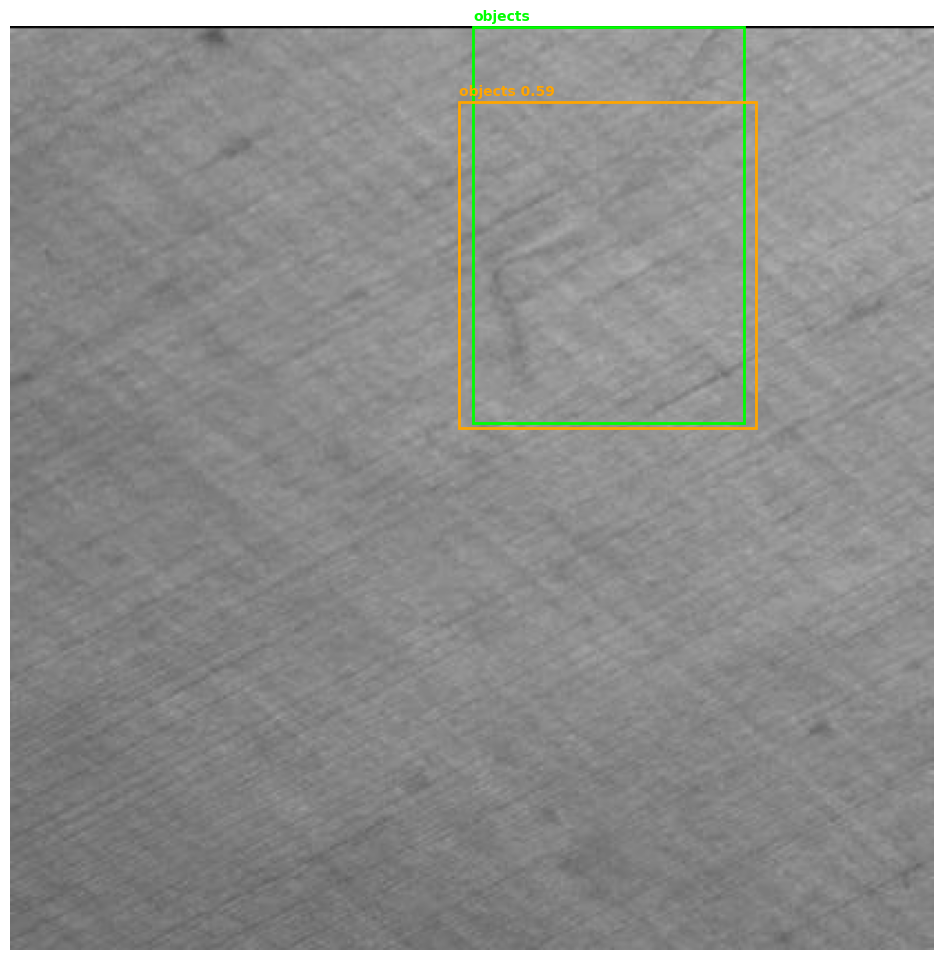

In [36]:
class_names = ["background", "defect", "hole", "objects", "oil_spot", "thread_error"]

model.eval()
images, targets = next(iter(val_loader))
img = images[0].to(device)
tgt = {k: v.to(device) for k,v in targets[0].items()}

with torch.no_grad():
    detections = model([img])[0]

visualize_detections_colored(img.cpu(), tgt, detections, class_names, score_thresh=0.3)

Image 0 detections: 1


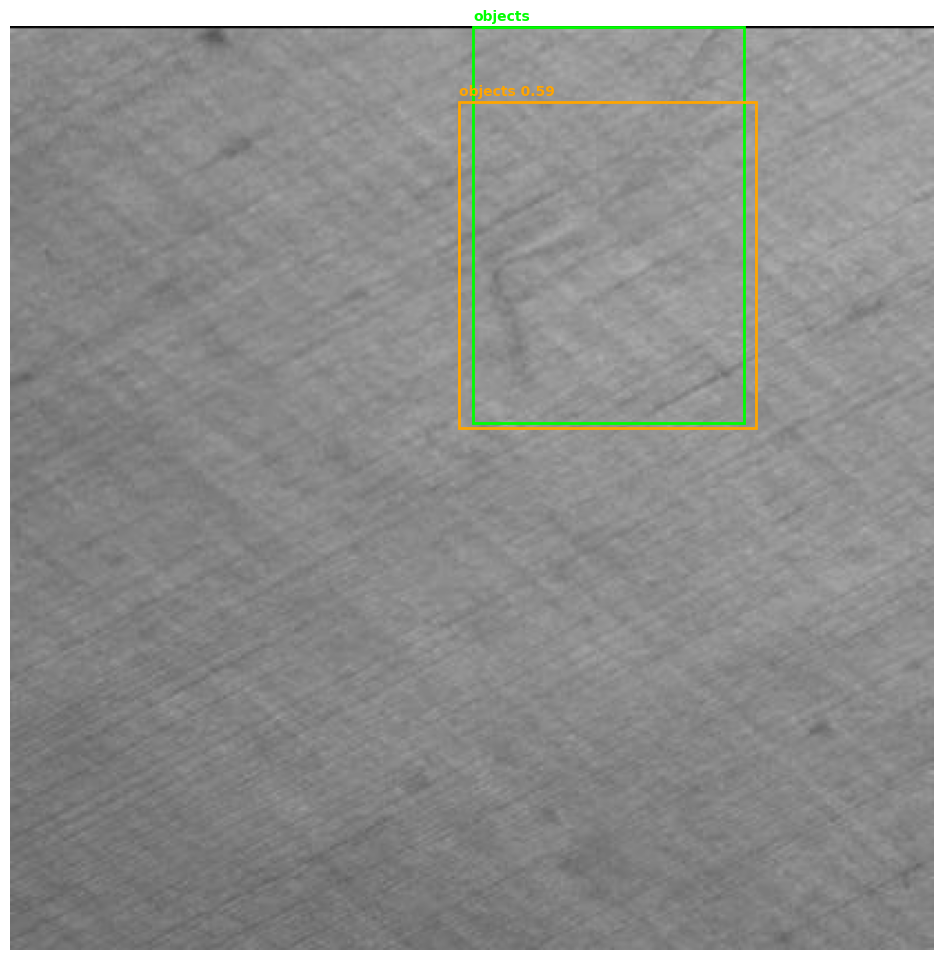

Image 1 detections: 1


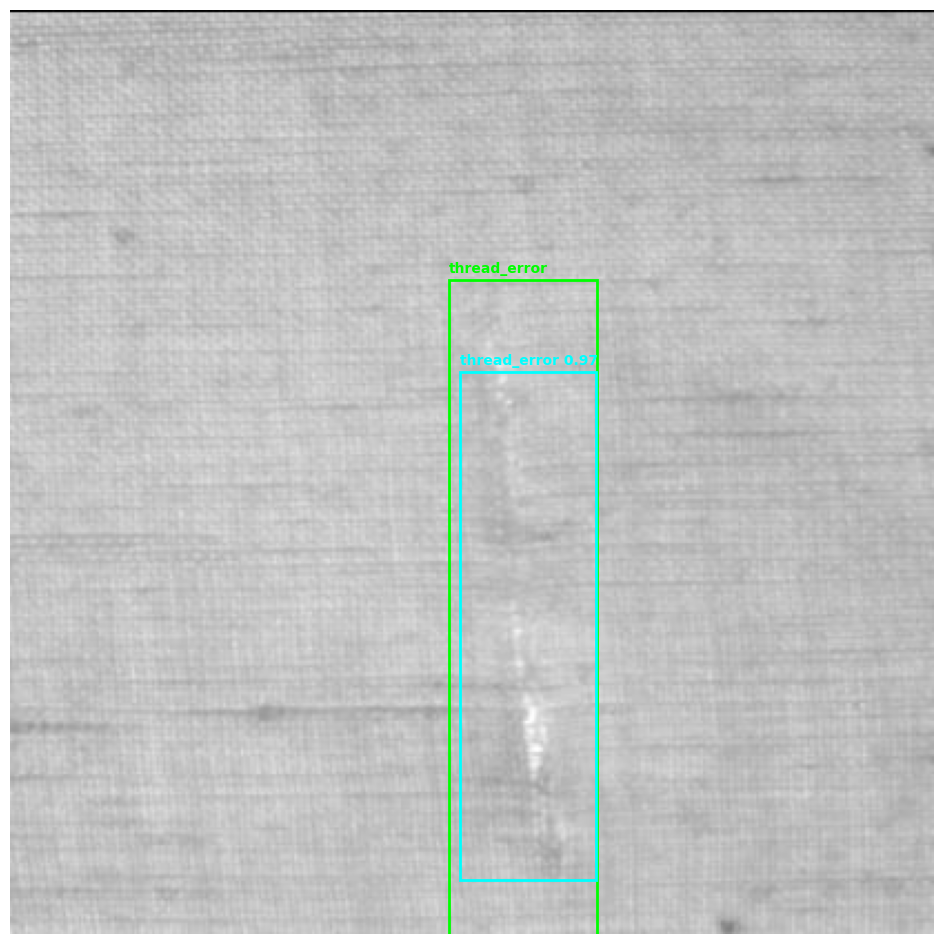

Image 2 detections: 1


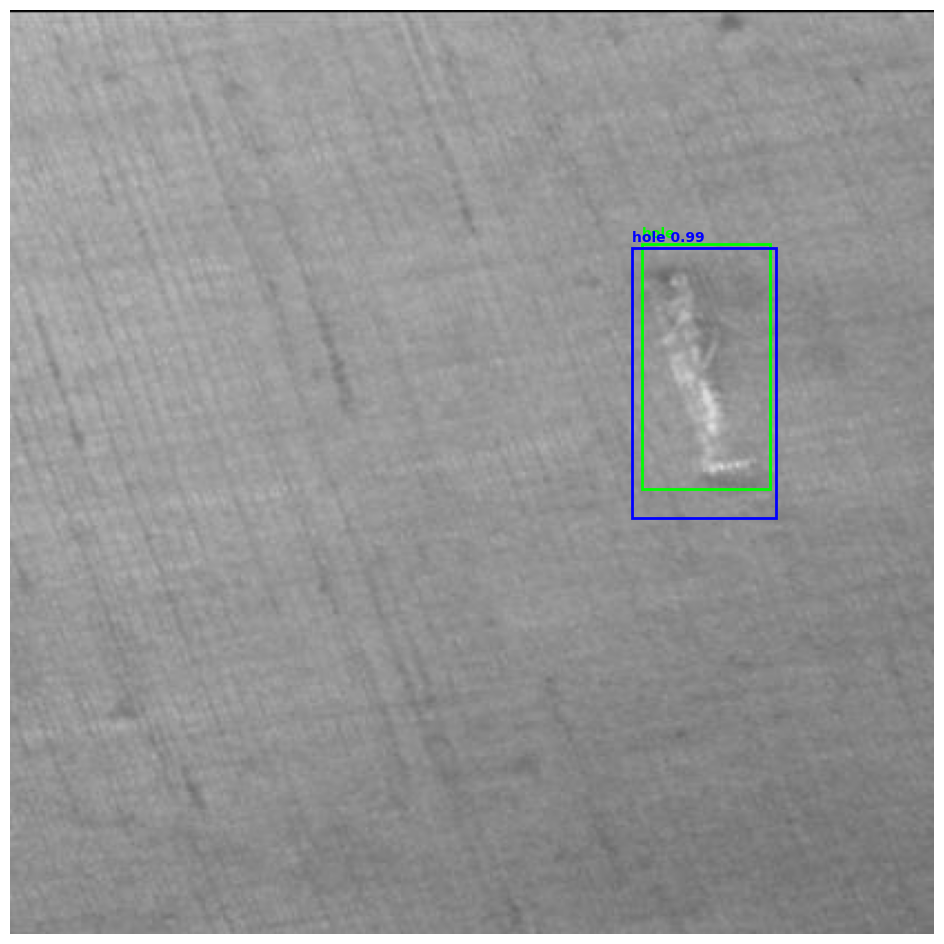

Image 3 detections: 2


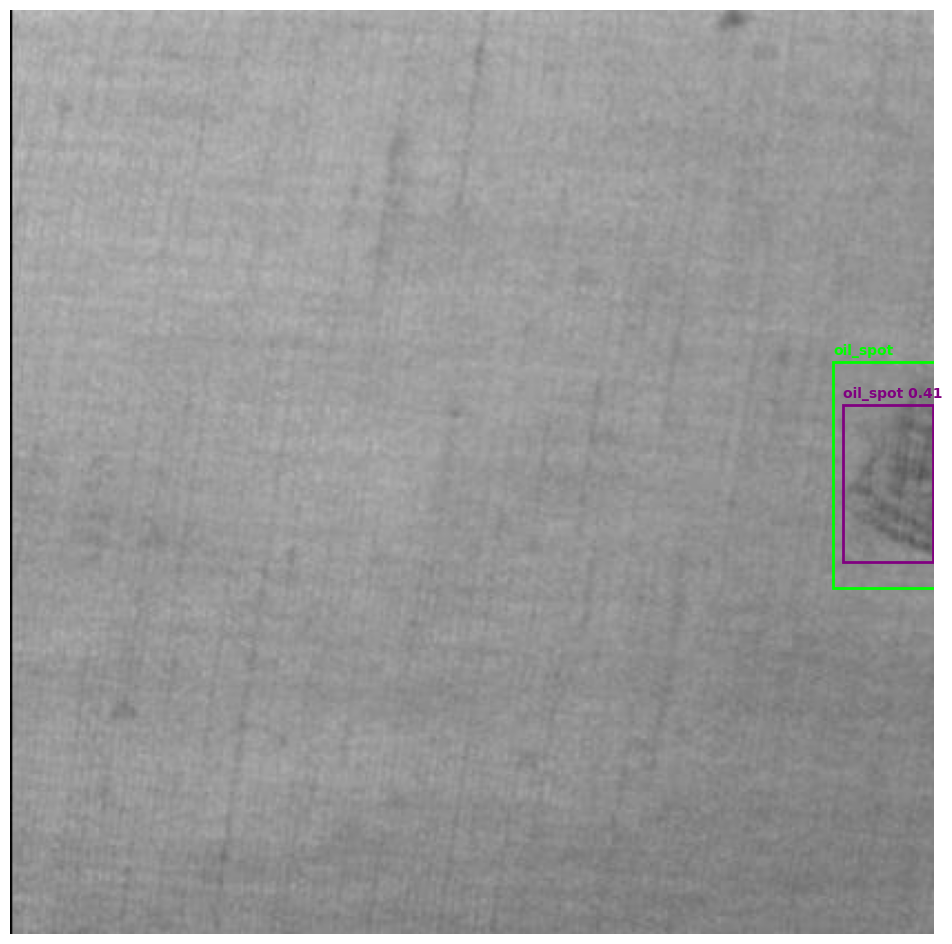

Image 4 detections: 1


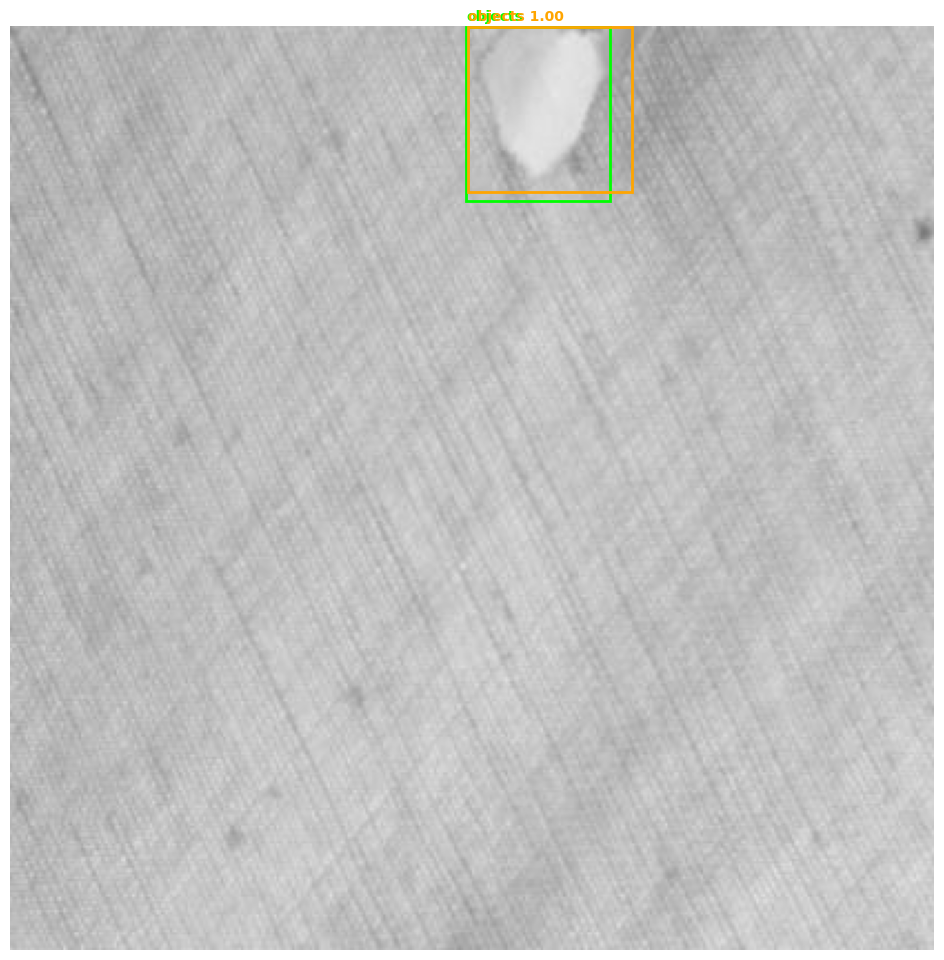

Image 5 detections: 1


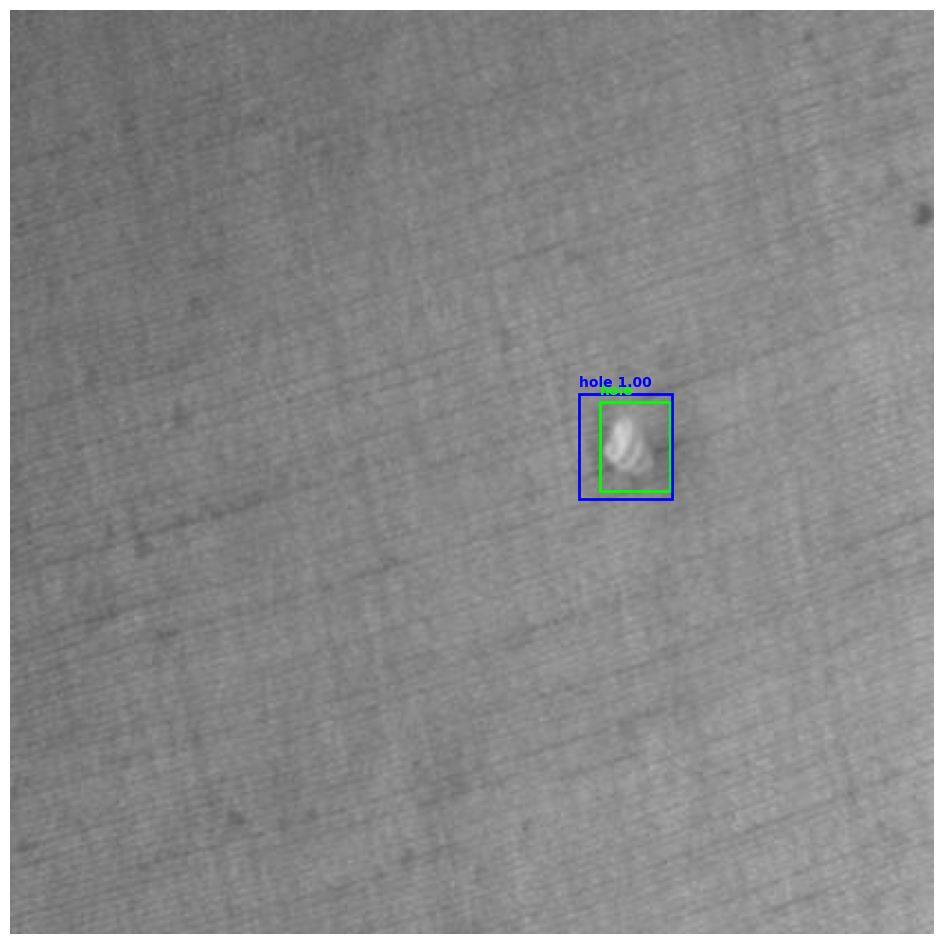

Image 6 detections: 1


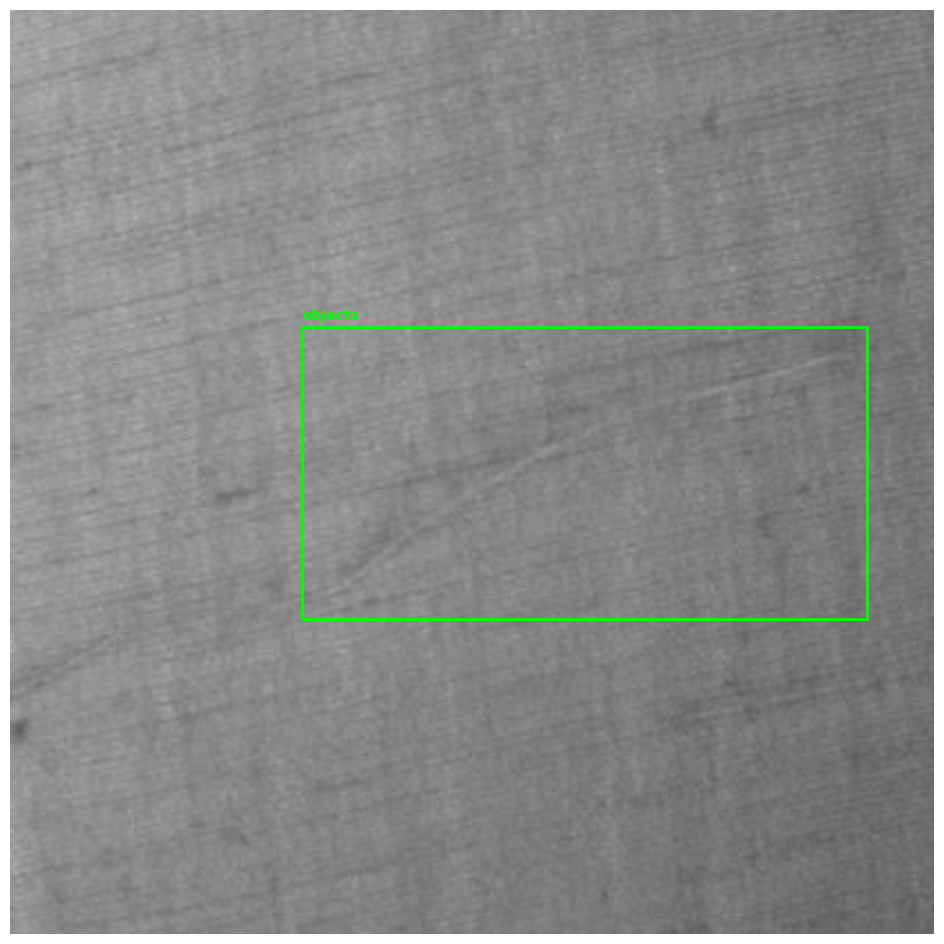

Image 7 detections: 3


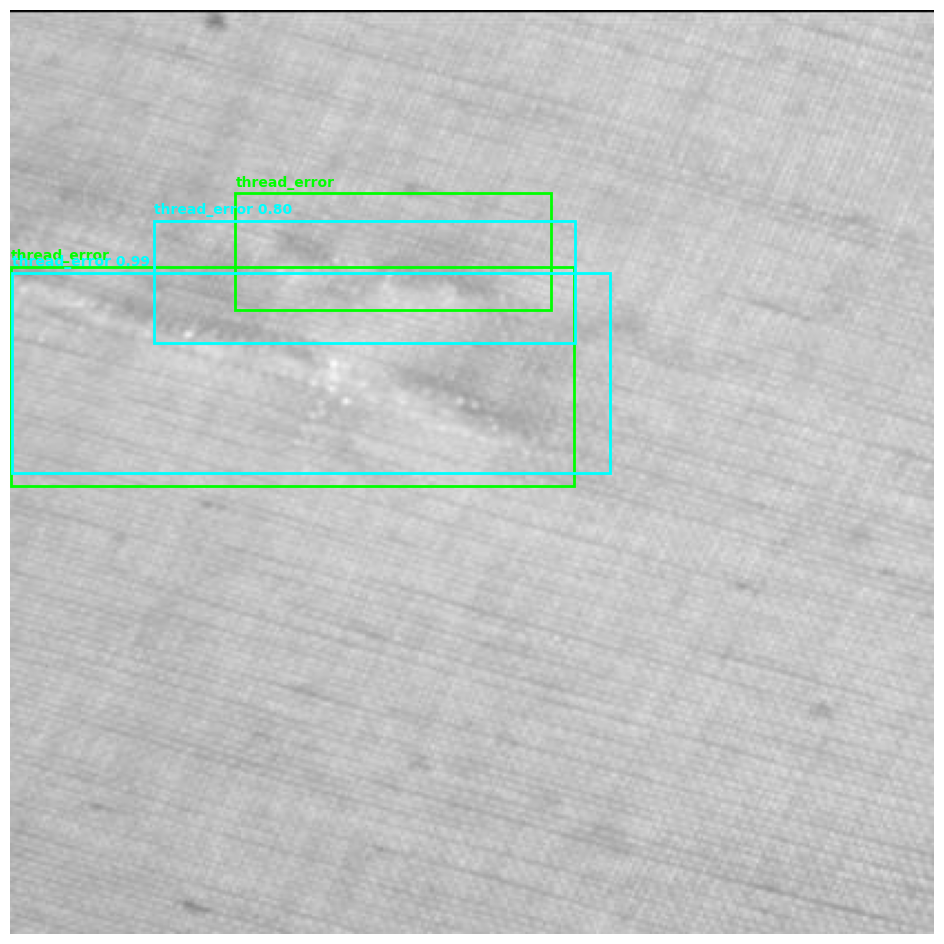

Image 8 detections: 1


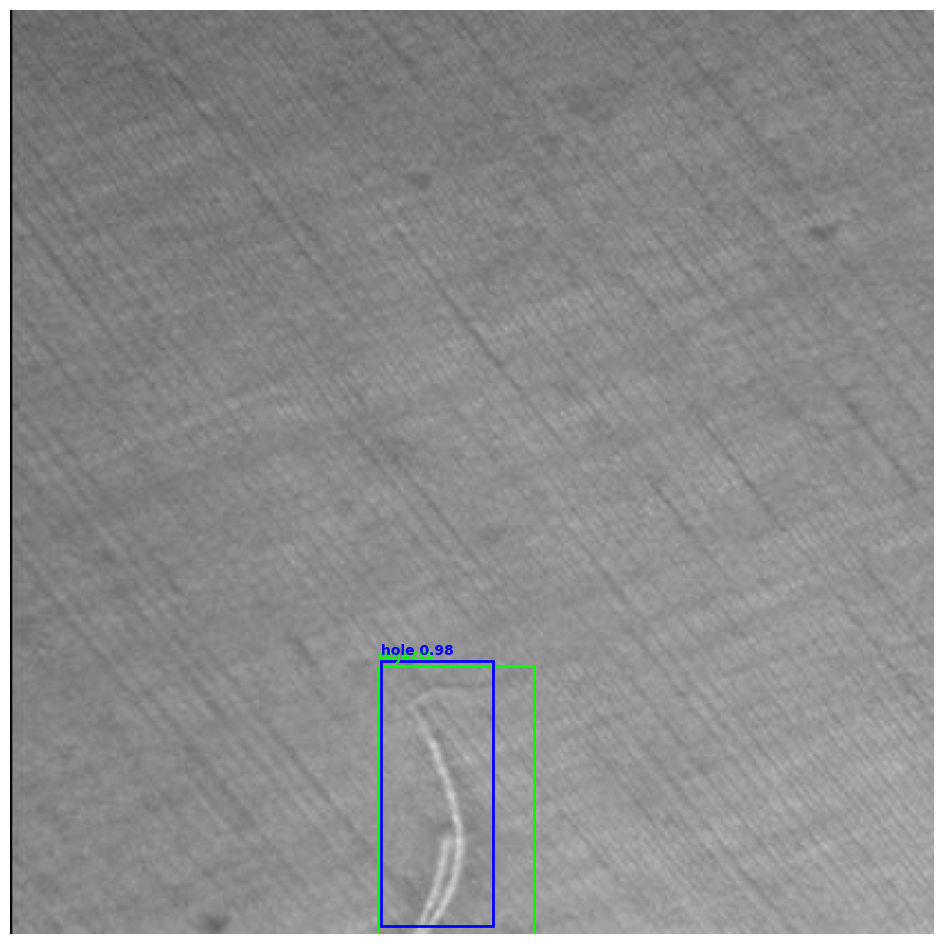

Image 9 detections: 2


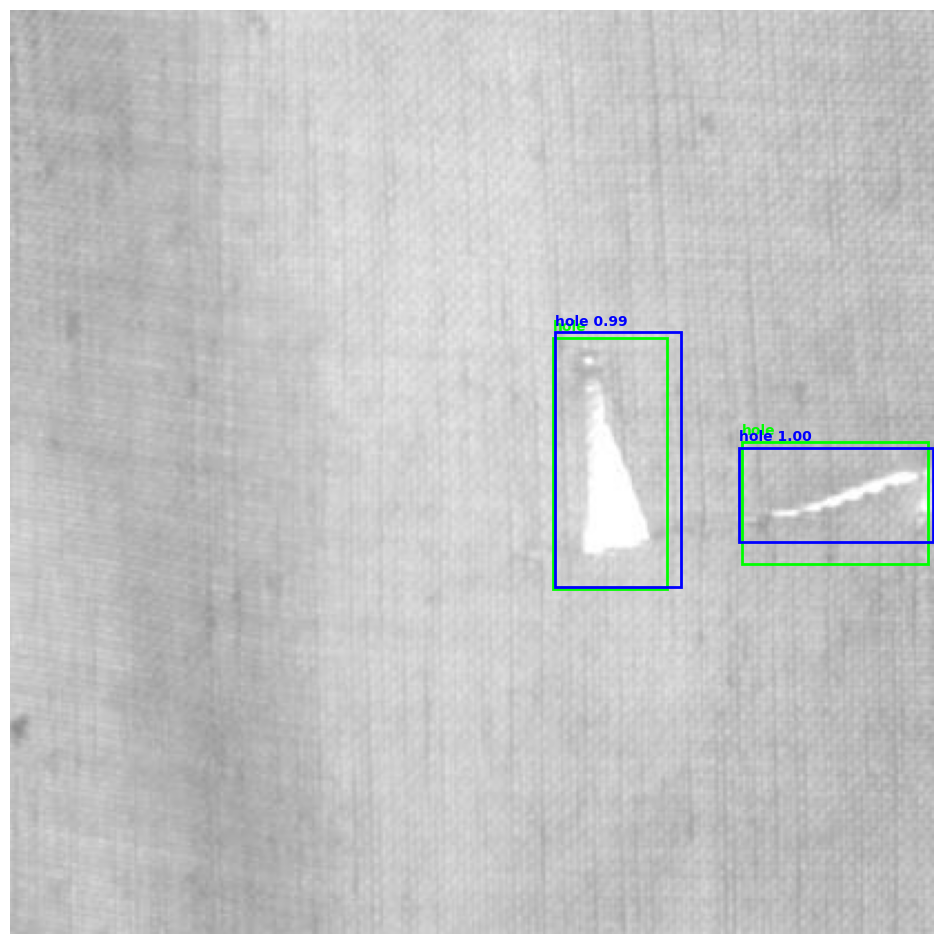

Image 10 detections: 1


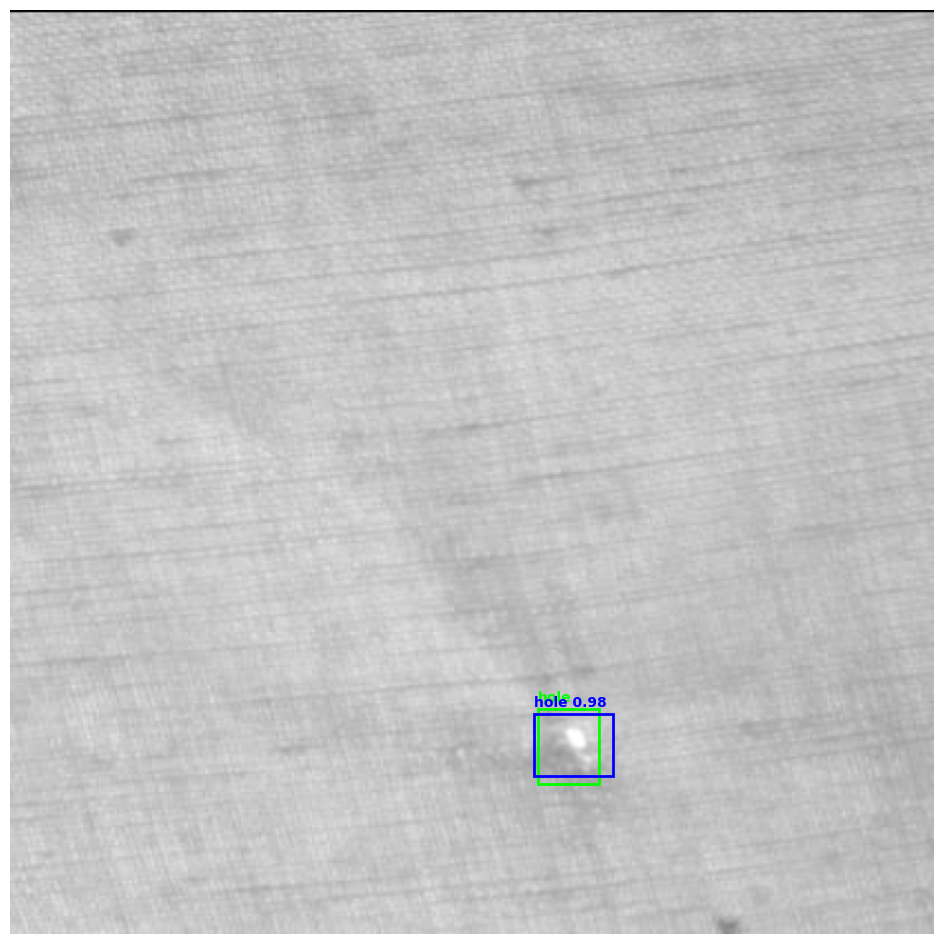

Image 11 detections: 0


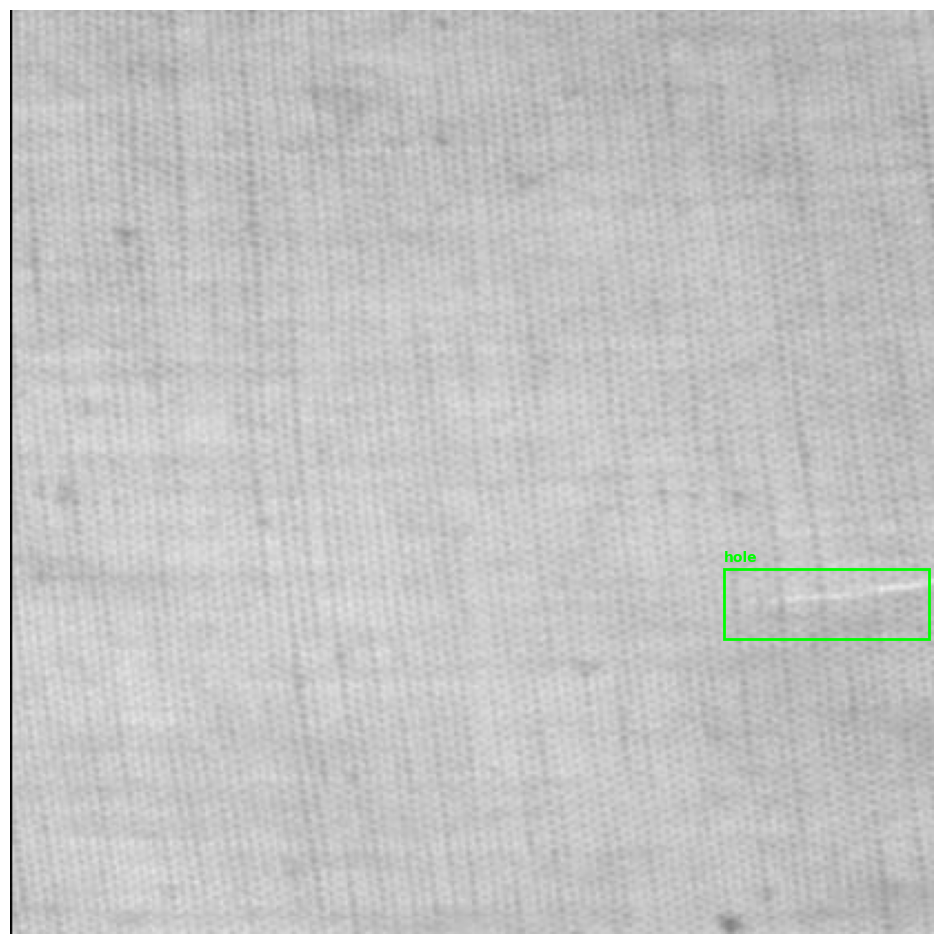

Image 12 detections: 2


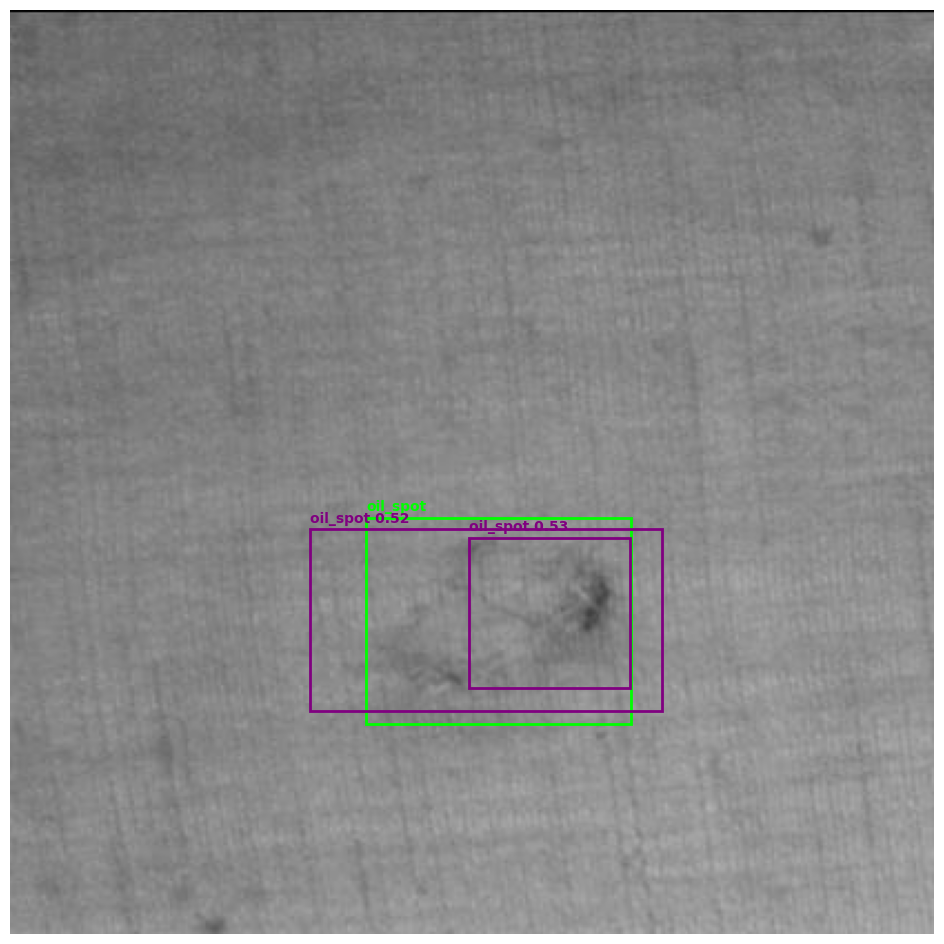

Image 13 detections: 1


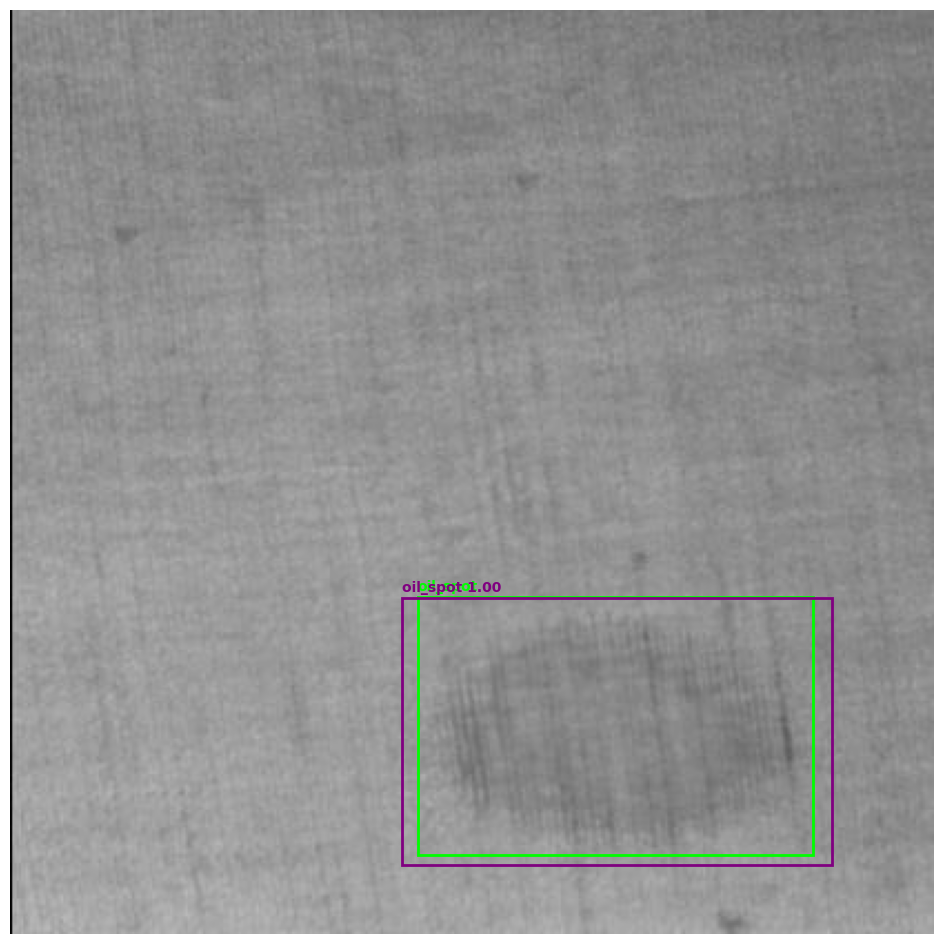

Image 14 detections: 1


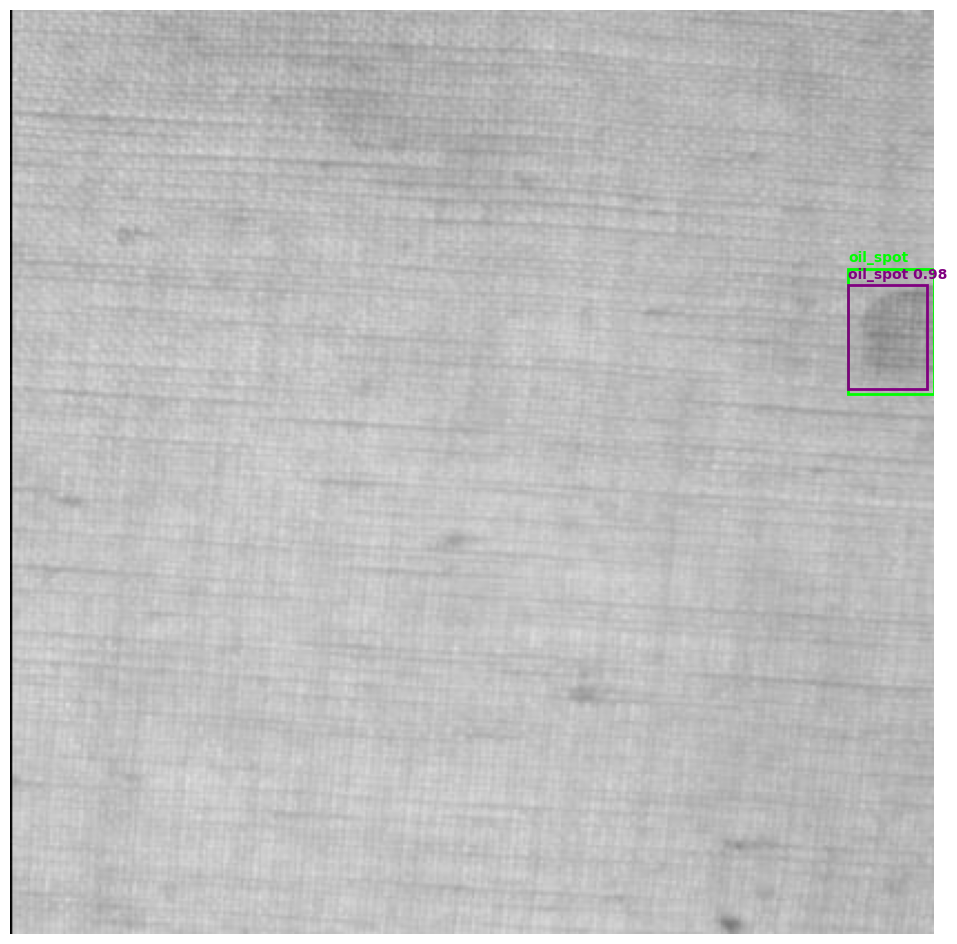

Image 15 detections: 1


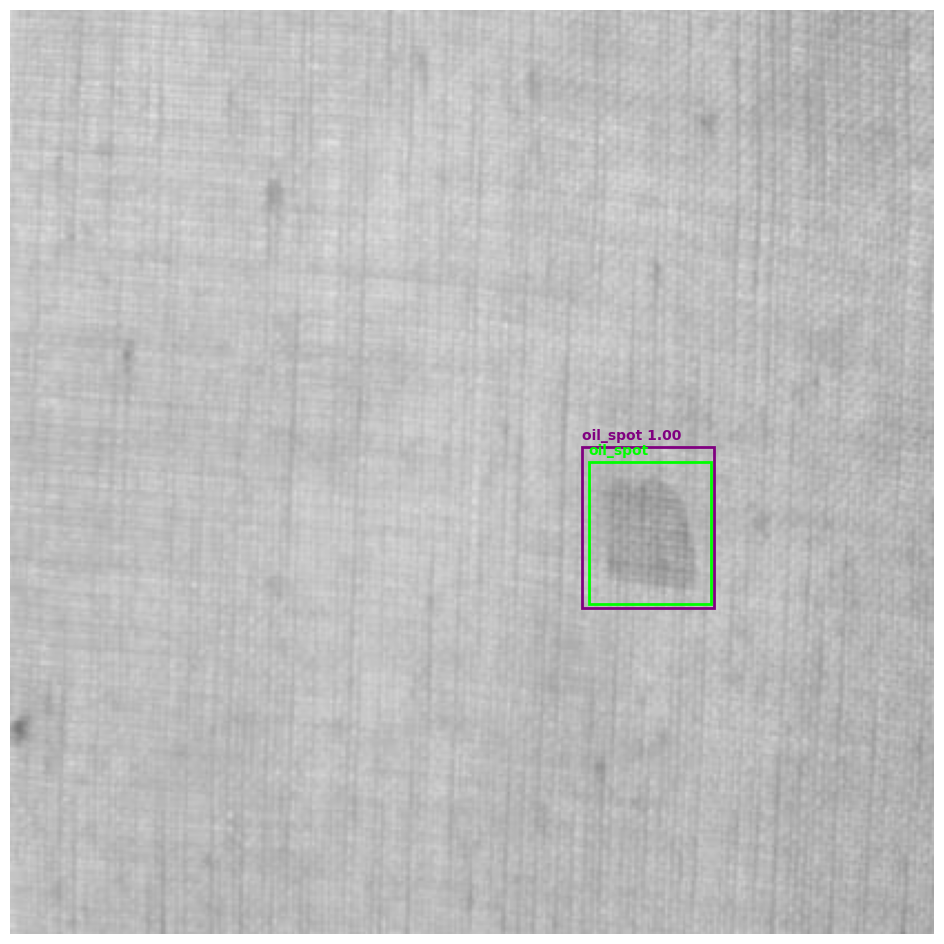

Image 16 detections: 1


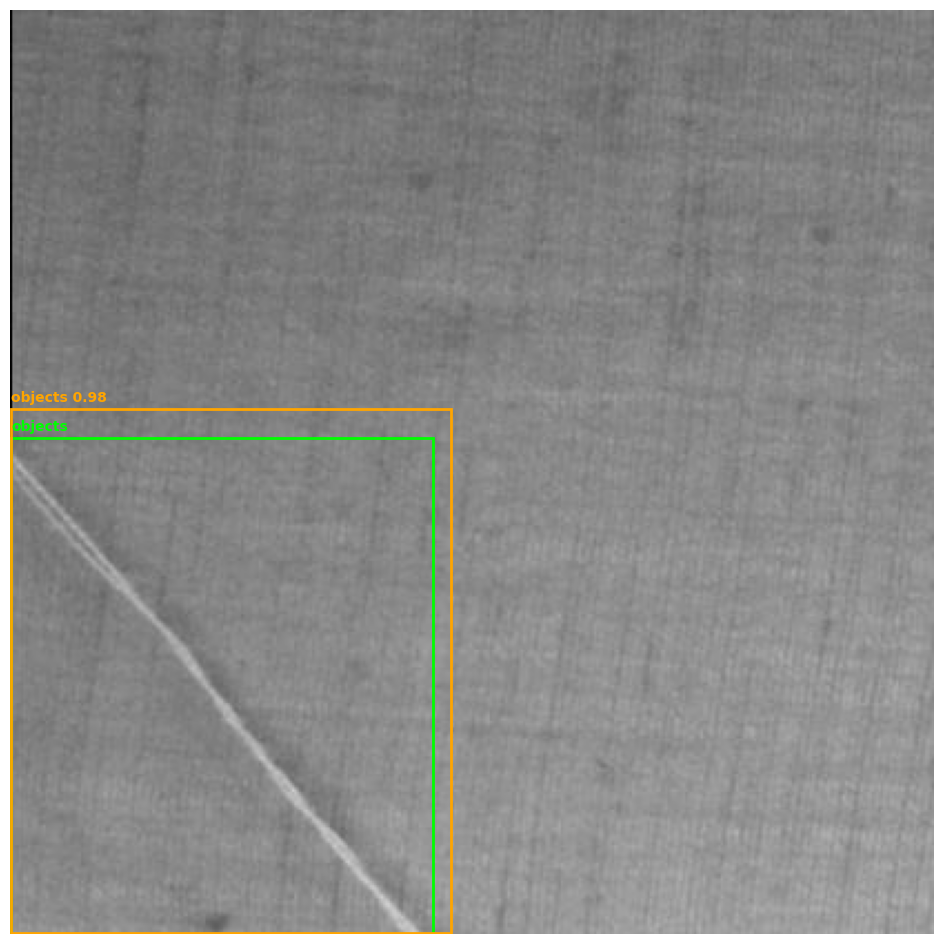

Image 17 detections: 8


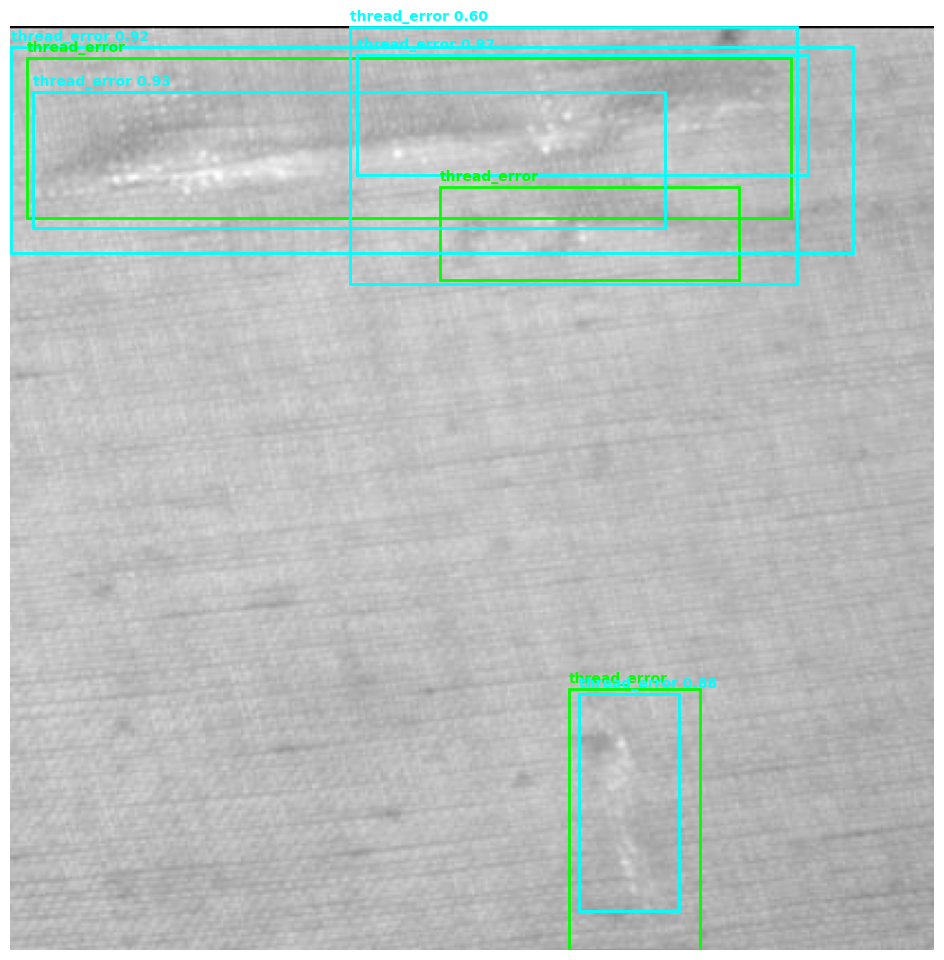

Image 18 detections: 1


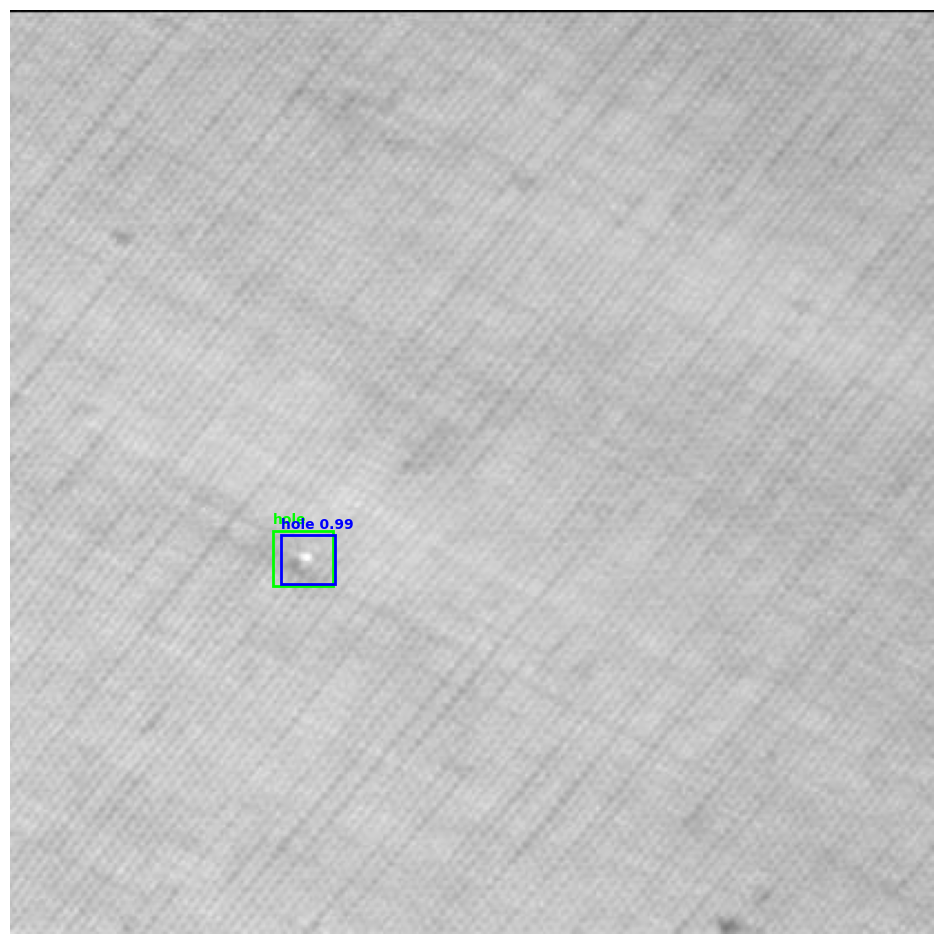

Image 19 detections: 1


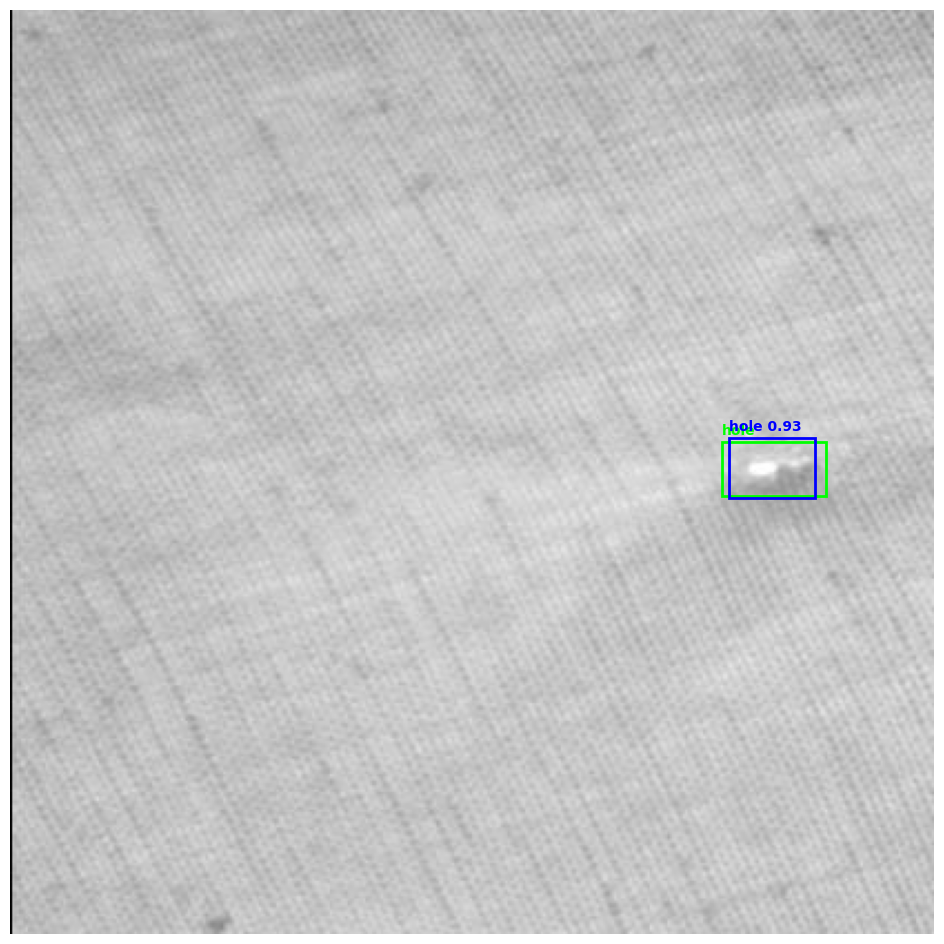

In [39]:
for i in range(20):   # show first 3 validation images
    img, tgt = val_ds[i]
    with torch.no_grad():
        detections = model([img.to(device)])[0]
    print(f"Image {i} detections:", detections.shape[0])
    visualize_detections_colored(img, tgt, detections,
                                 class_names=["background", "defect", "hole", "objects", "oil_spot", "thread_error"],
                                 score_thresh=0.4)